# Application results : Evolution of uncertainty on QualiAgro site under the different error scenarios

## For absolute SOC stock $C(t)$ and temporal SOC stock change $\Delta C(t)$

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import csv
import pickle
from scipy.integrate import odeint

from collections import defaultdict
import warnings

from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
from scipy.integrate import cumulative_trapezoid

from pathlib import Path




In [2]:
#%% get observation data (soil, climate, carbon inputs...) from long term experiment site QualiAgro 

data = pd.read_csv("../data/Qualiagro_input_AMG.csv")
data_LEG = data[data['ID_Treatment']=='QUA_LEG_TEM']
data_PRO = data[data['ID_Treatment']=='QUA_PRO_TEM']



In [3]:
#%% AMGv2 param from Clivot et al. (2019)

param={}
param['a_calcium'] = 0.0015
param['a_pH']      = 0.112
param['b_pH']      = 8.5
param['a_clay']    = 2.519*0.001
param['a_CN']      = 0.06
param['b_CN']      = 11
param['c_CN']      = 0.8
param['d_CN']      = 0.2
param['a_H']       = 0.03
param['b_H']       = 5.247
param['a_T']       = 25
param['T_ref']     = 15
param['c_T']       = 0.12
param['b_T']       = (param['a_T']-1)*np.exp(param['c_T'] *param['T_ref'] )
param['k0']        = 0.290

## Load mean inputs data and intermediate variables I and k required for the uncertainty propagation

The following dictionnaries (.npy) were created in the files generating the Monte Carlo simulations : ""generate_LUT_for_MC_all_scenario.py" and "generate_LUT_for_MC_carbon_credit.py"

- mean_t_treatment : dictionnary for which keys correspond to input values ['T', 'H', 'Clay', 'CaCO3', 'pH', 'C/N', 'I', 'QC0', 'r', 'I_CF', 'DI']. And mean_t_treatment[key] is a vector with dimenision time t containing the mean values over time. 'I_CF' corresponds to the carbon inputs humified in the carbon farming scenario, and 'DI' is the difference between the carbon inputs humified from carbon farming and baseline scenario. There is only one dictionary per treatment as mean values are not dependant of input error scenarios. 




- k_treatment : dictionnary for which keys correspond to pedoclimatic response functions modulating the mineralisation rate k and the mineralisation rate ['clay_stress', 'calcium_stress', 'pH_stress', 'CN_stress', 'T_stress', 'H_stress', 'mineralisation_rate']. And k_treatment[key] is a vector with dimension time t containing the mean values over time of each function and mineralisation rate.



In [4]:
# load mean inputs values with time t dimension_
# contain : ['T', 'H', 'Clay', 'CaCO3', 'pH', 'C/N', 'I', 'QC0', 'r', 'I_CF', 'DI']
mean_t_LEG = np.load('../inputs/mean_t_LEG.npy',allow_pickle=True).item()
mean_t_PRO = np.load('../inputs/mean_t_PRO.npy',allow_pickle=True).item()

# load peodclimatic response function modulating k with time t dimension_
# contain : ['clay_stress', 'calcium_stress', 'pH_stress', 'CN_stress', 'T_stress', 'H_stress', 'mineralisation_rate']
k_LEG = np.load('../inputs/k_LEG.npy',allow_pickle=True).item()
k_PRO = np.load('../inputs/k_PRO.npy',allow_pickle=True).item()

# duration time of the experiment studied (here 24 years for QualiAgro)
t = mean_t_LEG['T'].size

## Load vectors of sigma for all input and intermediate variables required for the uncertainty propagation

The following dictionnaries (.npy) were created in the files generating the Monte Carlo simulations : ""generate_LUT_for_MC_all_scenario.py" and "generate_LUT_for_MC_carbon_credit.py".
There is a dictionnary per error scenarios configuration and treatment, the name of the dictionnary follows this convention : 'treatment_err_term1_term2' 

(i) treatment : either 'LEG' or 'PRO'

(ii) The first term 'term1' corresponds to the error scenarios concerning pedoclimatic input variables and input variables to compute intermediate variables I and k (carbon inputs and mineralisation rate).

- opti : when both scenario are Field-scale error scenario
- pessim : when both scenario are Large-scale error scenario
- ACEOkLS : when the scenario concerning carbon inputs uncertainty is Field-scale scenario ('ACEO' for using AgriCarbon-EO error), and the error scenario for computing the mineralisation rate uncertainty is Large-scale scenario (kLS for Large-Scale error).
- regstatk10 : when the scenario concerning carbon inputs uncertainty is Large-scale scenario ('regstat' for using regional statistics error), and the error scenario for computing the mineralisation rate uncertainty is Field-scale scenario (k10 as in the field-scale scenario we assume a 10% relative error).

(iii) The second term 'term2' corresponds to the error scenarios concerning error in initial conditions QC0 (initial SOC_stock), and r (initial stable/total SOC ratio).

- local : when error on initial SOC stock QCO is 10% of relative error, and the initial stable/total SOC ratio r is initialised with Party_SOC model and Rock-Eval analysis (sigma_r = 0.06)
- large : when error on initial SOC stock QCO is 20% of relative error, and the initial stable/total SOC ratio r is initialised with default value (sigma_r = 0.18)
- mesdef : when error on initial SOC stock QCO corresponds to variance of measurement in QualiAgro dataset, and the initial stable/total SOC ratio r is initialised with default values (sigma_r=0.18)
- mesRE :  when error on initial SOC stock QCO corresponds to variance of measurement in QualiAgro dataset, and the initial stable/total SOC ratio r is initialised with Party_SOC model and Rock-Eval analysis (sigma_r = 0.06)
- localdef : when error on initial SOC stock QCO is 10% of relative error, and the initial stable/total SOC ratio r is initialised with default value (sigma_r = 0.18)
- largeRE :  when error on initial SOC stock QCO is 20% of relative error, and the initial stable/total SOC ratio r is initialised with Party_SOC model and Rock-Eval analysis (sigma_r = 0.06)


Each dictionnary contains the sigma vector over time (dimension t) for all input variables, organised by key : ['T', 'H', 'Clay', 'pH', 'C/N', 'I', 'QC0', 'CaCO3', 'r']

In [5]:
# get all the names of the dictionary files corresponding to the error scenario configuration  :
dir_path_sigma_t = Path("../inputs/sigma_t/absolute_SOC/")

fichiers_sigma_t_npy = [
    "_".join(f.stem.split('_')[:4])
    for f in dir_path_sigma_t.glob("*.npy")
]

names =fichiers_sigma_t_npy
# print names of all the dictionnary containing the sigmas vectors for each error scenario configuration
print(names)

## Now that I have all names I load them all here and called them with the same name as the .npy file
dir_path_sigma_t = "../inputs/sigma_t/absolute_SOC/"
for name in names:
    globals()[name] = np.load(
        f'{dir_path_sigma_t}{name}.npy',
        allow_pickle=True
    ).item()



['PRO_err_regstatk10_mesdef', 'LEG_err_opti_local', 'PRO_err_pessim_mesRE', 'LEG_err_opti_localdef', 'PRO_err_opti_localdef', 'PRO_err_pessim_mesdef', 'PRO_err_ACEOkLS_largeRE', 'LEG_err_opti_large', 'PRO_err_regstatk10_mesRE', 'LEG_err_ACEOkLS_mesdef', 'PRO_err_opti_mesRE', 'PRO_err_pessim_largeRE', 'PRO_err_ACEOkLS_localdef', 'LEG_err_opti_largeRE', 'PRO_err_pessim_local', 'PRO_err_opti_local', 'PRO_err_regstatk10_localdef', 'LEG_err_ACEOkLS_largeRE', 'LEG_err_pessim_mesRE', 'PRO_err_regstatk10_largeRE', 'LEG_err_pessim_localdef', 'LEG_err_regstatk10_local', 'PRO_err_ACEOkLS_mesdef', 'LEG_err_opti_mesdef', 'LEG_err_regstatk10_large', 'LEG_err_ACEOkLS_large', 'LEG_err_regstatk10_localdef', 'PRO_err_regstatk10_local', 'LEG_err_pessim_largeRE', 'PRO_err_ACEOkLS_local', 'PRO_err_ACEOkLS_large', 'PRO_err_regstatk10_large', 'PRO_err_opti_large', 'PRO_err_opti_largeRE', 'PRO_err_pessim_localdef', 'LEG_err_pessim_local', 'LEG_err_regstatk10_mesdef', 'LEG_err_regstatk10_mesRE', 'PRO_err_ACEOk

### Organise the data concerning error input scenarios configuration

- The dictionnary config is organised by error input scenario configuration, (e.g., err_ACEOkLS_large), and will contain all the sigma's input vector for both treatments LEG and PRO.

In [6]:
configs_name = np.unique(["_".join(name.split('_')[1:]) for name in fichiers_sigma_t_npy])
print('Error input scenario configuration name:', configs_name)

Error input scenario configuration name: ['err_ACEOkLS_large' 'err_ACEOkLS_largeRE' 'err_ACEOkLS_local'
 'err_ACEOkLS_localdef' 'err_ACEOkLS_mesRE' 'err_ACEOkLS_mesdef'
 'err_opti_large' 'err_opti_largeRE' 'err_opti_local' 'err_opti_localdef'
 'err_opti_mesRE' 'err_opti_mesdef' 'err_pessim_large'
 'err_pessim_largeRE' 'err_pessim_local' 'err_pessim_localdef'
 'err_pessim_mesRE' 'err_pessim_mesdef' 'err_regstatk10_large'
 'err_regstatk10_largeRE' 'err_regstatk10_local' 'err_regstatk10_localdef'
 'err_regstatk10_mesRE' 'err_regstatk10_mesdef']


In [7]:
configs = {}

for name in configs_name:
    try:
        configs[name] = (globals()[f"LEG_{name}"], globals()[f"PRO_{name}"])
    except KeyError:
        print(f"Config ignored (variable not found) : {name}")

print(configs.keys())

dict_keys(['err_ACEOkLS_large', 'err_ACEOkLS_largeRE', 'err_ACEOkLS_local', 'err_ACEOkLS_localdef', 'err_ACEOkLS_mesRE', 'err_ACEOkLS_mesdef', 'err_opti_large', 'err_opti_largeRE', 'err_opti_local', 'err_opti_localdef', 'err_opti_mesRE', 'err_opti_mesdef', 'err_pessim_large', 'err_pessim_largeRE', 'err_pessim_local', 'err_pessim_localdef', 'err_pessim_mesRE', 'err_pessim_mesdef', 'err_regstatk10_large', 'err_regstatk10_largeRE', 'err_regstatk10_local', 'err_regstatk10_localdef', 'err_regstatk10_mesRE', 'err_regstatk10_mesdef'])


## Compute analytical uncertainty of mineralisation rate k (Taylor 1st order)

As in file 'uncertainty_mineralisation_sensitivity.ipynb', we compute the contribution of each pedoclimatic response function to the uncertainty of mineralisation rate k. 
As a reminder, in the paper, we show in equation 2.12 that the expression of the uncertainty of the mineralisation rate k is a sum of each pedoclimatic function uncertainty contribution.

$
\sigma_{k}^2 = k^2 \sum_{i=1}^{N} \left (\frac{ f_{i}'(x_i)}{f_{i}(x_i)} \right)^2\sigma_{x_i}^2    
$


 Here we compute each function contribution to the uncertainty. First, we compute each $\left (\frac{ f_{i}'(x_i)}{f_{i}(x_i)} \right)\sigma_{x_i} $, via the different w_f() functions.

In [8]:
def w_fT(param, T, sigma):
    b_T = param['b_T']
    c_T = param['c_T']
    eps = abs(b_T * c_T * np.exp(-c_T*T) / (1 + b_T*np.exp(-c_T*T)))
    w = eps*sigma
    return w


def w_CaCO3(param,CACO3, sigma):
    c_m = param['a_calcium']
    eps = abs(-c_m/(1+c_m*CACO3))
    w = eps * sigma
    return w

def w_pH(param, pH, sigma):
    a_pH = param['a_pH']
    b_pH = param['b_pH']
    eps = abs(-2*a_pH*(pH-b_pH))
    w = eps * sigma
    return w

def w_CN(param,CN_ratio, sigma):
    a_CN = param['a_CN']
    b_CN = param['b_CN']    
    fp_CN = -1.6 * a_CN *(CN_ratio- b_CN)*np.exp(-a_CN *(CN_ratio-b_CN)**2)
    f = 0.8 * np.exp(-a_CN*(CN_ratio-b_CN)**2) + 0.2
    eps = abs(fp_CN/f)
    w = eps * sigma
    return w

def w_Hm(param, H, sigma):
    # In general : H = Rain - PET + irrigation
    a_H = param['a_H']
    b_H = param['b_H']
    eps = abs((a_H*b_H*np.exp(-b_H*H/1000))/(1000*(1+ a_H*np.exp(-b_H*H/1000))))
    w = eps * sigma
    return w

def w_Clay(param, sigma):
    a_Clay = param['a_clay']
    eps = abs(-a_Clay)
    w = eps*sigma
    return w

# we store all contribution in a dictionary
def contrib_k(param, mean_t, sigma_t):
    w_k={}
    w_k['T'] = w_fT(param, mean_t['T'], sigma_t['T'])**2
    w_k['H'] = w_Hm(param, mean_t['H'], sigma_t['H'])**2
    w_k['CaCO3'] = w_CaCO3(param, mean_t['CaCO3'], sigma_t['CaCO3'])**2
    w_k['Clay'] = w_Clay(param, sigma_t['Clay'])**2
    w_k['pH'] = w_pH(param, mean_t['pH'], sigma_t['pH'])**2
    w_k['C/N'] = w_CN(param, mean_t['C/N'], sigma_t['C/N'])**2
    return w_k
    


In [9]:
# we compute sigma k, first the contribution of each stress function w, and then var k (sigma2), finally sigma k

# dictionary that will store the uncertainty of mineralisation rate
sigma_stress = {}

# dictionaries that will store the contribution of each peodclimatic 
    #response function to the uncertainty of mineralisation rate :
    
Wk_LEG={}
Wk_PRO ={}

# we loop on each error scenario configuration, stored in the dictionary config for both treatments LEG and PRO
for name, (sigma_LEG, sigma_PRO) in configs.items():
    w_LEG = contrib_k(param, mean_t_LEG, sigma_LEG)
    w_PRO = contrib_k(param, mean_t_PRO, sigma_PRO)
    Wk_LEG[f'{name}_LEG'] = w_LEG
    Wk_PRO[f'{name}_PRO'] = w_PRO
    sigma2_LEG = k_LEG['mineralisation_rate']**2 * sum(
        w_LEG[k] for k in ['T', 'H', 'CaCO3', 'Clay', 'pH', 'C/N']
    )
    sigma2_PRO = k_PRO['mineralisation_rate']**2 * sum(
        w_PRO[k] for k in ['T', 'H', 'CaCO3', 'Clay', 'pH', 'C/N']
    )

    sigma_stress[f'{name}_LEG'] = {'mineralisation_rate': np.sqrt(sigma2_LEG)}
    sigma_stress[f'{name}_PRO'] = {'mineralisation_rate': np.sqrt(sigma2_PRO)}


## Load all Monte Carlo simulations

The Monte Carlo simulations are called after the error scenario configuration and the treatment as the input sigma's vectors, but with the mention AMG_LUT.

The Monte Carlo simulations are generated by running the file "generate_LUT_for_MC_all_scenario.py", that will be stored in the repertory '../outputs/LUT_MC/absolute_SOC/AMG_LUT/'.




In [10]:
## Load only the simulations with sample size n=10⁵
n = 100000
## First I get all the names of the dictionary files :
dir_path = Path("../outputs/LUT_MC/absolute_SOC/AMG_LUT/")
fichiers_AMG_LUT_npy = [
    "_".join(f.stem.split('_')[:5])
    for f in dir_path.glob("*.npy")
]
print(np.unique(fichiers_AMG_LUT_npy))

names =fichiers_AMG_LUT_npy


## Now that I have all names I load them all here and called them with the same name as the .npy file
dir_path = "../outputs/LUT_MC/absolute_SOC/AMG_LUT/"

for name in names:
    globals()[f'err_{name}'] = np.load(
        f'{dir_path}{name}_n_{n}.npy',
        allow_pickle=True
    ).item()


['ACEOkLS_largeRE_AMG_LUT_LEG' 'ACEOkLS_largeRE_AMG_LUT_PRO'
 'ACEOkLS_large_AMG_LUT_LEG' 'ACEOkLS_large_AMG_LUT_PRO'
 'ACEOkLS_local_AMG_LUT_LEG' 'ACEOkLS_local_AMG_LUT_PRO'
 'ACEOkLS_localdef_AMG_LUT_LEG' 'ACEOkLS_localdef_AMG_LUT_PRO'
 'ACEOkLS_mesRE_AMG_LUT_LEG' 'ACEOkLS_mesRE_AMG_LUT_PRO'
 'ACEOkLS_mesdef_AMG_LUT_LEG' 'ACEOkLS_mesdef_AMG_LUT_PRO'
 'opti_largeRE_AMG_LUT_LEG' 'opti_largeRE_AMG_LUT_PRO'
 'opti_large_AMG_LUT_LEG' 'opti_large_AMG_LUT_PRO'
 'opti_local_AMG_LUT_LEG' 'opti_local_AMG_LUT_PRO'
 'opti_localdef_AMG_LUT_LEG' 'opti_localdef_AMG_LUT_PRO'
 'opti_mesRE_AMG_LUT_LEG' 'opti_mesRE_AMG_LUT_PRO'
 'opti_mesdef_AMG_LUT_LEG' 'opti_mesdef_AMG_LUT_PRO'
 'pessim_largeRE_AMG_LUT_LEG' 'pessim_largeRE_AMG_LUT_PRO'
 'pessim_large_AMG_LUT_LEG' 'pessim_large_AMG_LUT_PRO'
 'pessim_local_AMG_LUT_LEG' 'pessim_local_AMG_LUT_PRO'
 'pessim_localdef_AMG_LUT_LEG' 'pessim_localdef_AMG_LUT_PRO'
 'pessim_mesRE_AMG_LUT_LEG' 'pessim_mesRE_AMG_LUT_PRO'
 'pessim_mesdef_AMG_LUT_LEG' 'pessim_mesdef

# Analytical Stationary case : uncertainty propagation (equations 2.16 - 2.18 and 3.1)

In the stationary case, as the intermediate variables I and k are constant over time, the system of differential equations 2.16 is completely solved analytically. The solutions of the system are 4 intermediate variables noted M1(t), M2(t), M11(t) and N11(t),  that allow to compute the expectation value and standard deviation (or variance) of the target variable : absolut SOC stock $C(t)$, the temporal SOC stock change $\Delta C(t)$ and the difference of SOC stock between two management practices $D(t)$ (see eq. 2.18).

In [11]:
## We compute the expectation value E and the uncertainty (sigma and variance) :
## - of the absolute SOC stock C(t)
## - of the temporal SOC stock change ΔC(t)

"""
We return two dictionnary, on per SOC variable, containing : 
- the vector of expectation value E over time : result['E']
- the vector of uncertainty over time : result['sigma']
- the vector of the variance over time : result['var']

"""

def E_VAR_stationnary(means_input, stress, sigma_input, sigma_stress, time):

    ## As we are in the stationary case, we take the mean value of the intermediate variables : 
    
    # Mineralisation rate k
    mu_k = np.mean(stress['mineralisation_rate'])
    sigma_k = np.mean(sigma_stress['mineralisation_rate'])

    # Carbon inputs humified I
    mu_I = np.mean(means_input['I'])
    sigma_I = np.mean(sigma_input['I'])

    # Initials conditions : SOC stock C0 and initial stable/total SOC ratio r
    mu_C0, sigma_C0 =  means_input['QC0'][0],  sigma_input['QC0'][0]
    mu_r = means_input['r'][0]
    sigma_r = sigma_input['r'][0]

    # vector time of the simulation
    t = np.arange(0, time, 1)

    # coefficient defined in eq. (2.17)
    a_k = mu_k - 0.5 * sigma_k**2
    b_k = mu_k - sigma_k**2
    d_k = mu_k - (3/2)*sigma_k**2

    
    ## Solution of the system of the differential equations :
    # M1(t) = E[C(t)]
    M1_0 = mu_C0
    M1_inf = (mu_I/a_k) + mu_r*mu_C0
    M1_t = M1_inf + (M1_0 - M1_inf)*np.exp(-a_k*t)
    
    # M11(t) = E[r.C0.C(t)]
    M11_0 = mu_r *(mu_C0*mu_C0 + sigma_C0*sigma_C0) 
    s2 = (mu_C0*mu_C0 + sigma_C0*sigma_C0) * (mu_r*mu_r + sigma_r*sigma_r) 
    M11_inf = s2 + (mu_I*mu_r*mu_C0)/a_k
    M11_t = M11_inf +(M11_0-M11_inf)*np.exp(-a_k*t)
    
    # M2(t) = E[C(t)²]
    A = (2*d_k*M11_inf + 2*mu_I*M1_inf + sigma_k*sigma_k*s2 + sigma_I*sigma_I)/(2*b_k)
    B = (2*d_k*(M11_0-M11_inf) + 2*mu_I*(M1_0-M1_inf))/d_k
    C = mu_C0*mu_C0 + sigma_C0*sigma_C0
    M2_t = A*(1-np.exp(-2*b_k*t)) + B*(np.exp(-a_k*t) - np.exp(-2*b_k*t)) + C*np.exp(-2*b_k*t)
    
    # N11(t) = E[C0.C(t)] (see eq. C.37) 
    u2 = mu_r *(mu_C0*mu_C0 + sigma_C0*sigma_C0)  # it is also M11_0
    N11_inf = (mu_I*mu_C0/a_k) + u2
    N11_0 = (mu_C0*mu_C0 + sigma_C0*sigma_C0)
    N11_t = N11_inf + (N11_0-N11_inf)*np.exp(-a_k*t)
    
    
    ## Compute expactation and uncertainty values of the SOC target variables
    
    ## For the absolute SOC stock C(t) :
    # Var[C(t)] = M2(t) - M1(t)*M1(t)
    Var_C_t = M2_t - M1_t*M1_t
    
    
    ## For the temporal SOC stock change ΔC(t) :
    # E[ΔC(t))] :
    Mean_Delta_C_t = M1_t - mu_C0
    
    # Var[ΔC(t)] = Var[C(t)] + sigma_C0**2 - 2N11(t) + 2*mu_C0*M1(t)
    Var_Delta_C_t = Var_C_t + sigma_C0**2 - 2*N11_t + 2*mu_C0*M1_t
    
    # we store the results in a dictionary per target variable
    
    # for absolute SOC stock
    result_C ={}
    result_C['E'] = M1_t
    result_C['sigma'] = np.sqrt(Var_C_t)
    result_C['var'] = Var_C_t
    
    # for temporal SOC stock change in time ΔC(t)
    result_Delta_C ={}
    result_Delta_C['E'] = Mean_Delta_C_t
    result_Delta_C['sigma'] = np.sqrt(Var_Delta_C_t)
    result_Delta_C['var'] = Var_Delta_C_t

    return result_C, result_Delta_C


# Analytical non-stationary case : uncertainty propagation (equations 2.15 - 2.18)

In the non-stationary case, the system of differential equations 2.16 is solved numerically with the odeint function from the python library scipy.integrate. The solutions of the system are 4 intermediate variables noted M1(t), M2(t), M11(t) and N11(t),  that allow to compute the expectation value and standard deviation (or variance) of the target variable : absolut SOC stock $C(t)$, the temporal SOC stock change $\Delta C(t)$ and the difference of SOC stock between two management practices $D(t)$ (see eq. 2.18).


In [12]:
# We define the system of differential equations (2.16)
def AMG_system_QC_odeint(Y, t, mu_I_t, sigma_I_t, mu_k_t, sigma_k_t,
                         a_k_t, b_k_t, d_k_t, mu_C0, sigma_C0, mu_r, sigma_r):

    M1, M11, M2, N11 = Y
    # t = int(t)
    t= min(int(np.floor(t)), len(a_k_t) - 1)
    s2 = (mu_C0**2 + sigma_C0**2) * (mu_r**2 + sigma_r**2)
    dM1  = -a_k_t[t]*M1  + a_k_t[t]*mu_r*mu_C0 + mu_I_t[t]
    dM11 = -a_k_t[t]*M11 + a_k_t[t]*s2 + mu_I_t[t]*mu_r*mu_C0
    dM2  = (-2*b_k_t[t]*M2 + 2*d_k_t[t]*M11
            + 2*mu_I_t[t]*M1
            + s2*(sigma_k_t[t]**2)
            + sigma_I_t[t]**2)
    dN11 = -a_k_t[t]*N11 + a_k_t[t]*mu_r*(sigma_C0*sigma_C0 + mu_C0*mu_C0) + mu_I_t[t]*mu_C0

    return [dM1, dM11, dM2, dN11]


# We define the coefficients of the systems of differential equations (2.16)
def coeffs(means_input, stress, sigma_input, sigma_stress) :

    mu_k_t = stress['mineralisation_rate']
    sigma_k_t = sigma_stress['mineralisation_rate']
    
    mu_I_t = means_input['I']
    sigma_I_t = sigma_input['I']
    
    a_k_t = mu_k_t - 0.5*(sigma_k_t*sigma_k_t)
    b_k_t = mu_k_t - (sigma_k_t*sigma_k_t)
    #d_k_t = 2*b_k_t - a_k_t
    d_k_t = mu_k_t - (3/2)*(sigma_k_t*sigma_k_t)
    
    mu_C0 = means_input['QC0'][0]
    sigma_C0 = sigma_input['QC0'][0]
    
    mu_r = means_input['r'][0]
    sigma_r = sigma_input['r'][0]
    
    return mu_I_t, sigma_I_t, mu_k_t, sigma_k_t, a_k_t, b_k_t, d_k_t, mu_C0,sigma_C0,mu_r, sigma_r


# We define the initial conditions of the system (2.16)
def init_QC(means_input, stress, sigma_input, sigma_stress):
    mu_C0 = means_input['QC0'][0]
    sigma_C0 = sigma_input['QC0'][0]
    
    mu_r = means_input['r'][0]
    
    Y0 = [
        mu_C0,
        mu_r*(mu_C0**2 + sigma_C0**2),
        mu_C0**2 + sigma_C0**2,
        mu_C0**2 + sigma_C0**2
    ]
    return Y0


# We compute the expectation value and uncertainty of the absolute SOC stock C(t) based on the solution of the system
# see eq. (2.18)
def E_sigma_QC_vari_odeint(sol_odeint_QC):
    
    # we get the solutions of the system of differential equations (2.16)
    M1 = sol_odeint_QC[:,0]
    M11 = sol_odeint_QC[:,1]
    M2 = sol_odeint_QC[:,2]
    
    # we compute the variance of the absolute SOC stock
    Var_C =  M2 - M1*M1
    
    # we store the results in a dictionary
    result = {}
    result['E']= M1
    result['sigma']=np.sqrt(Var_C)
    return result


# We compute the expectation value and uncertainty of the delta SOC stock in time ΔC(t) based on the solution of the system
# see eq. (2.18)

def E_sigma_Delta_tf_t0_QC_vari_odeint(sol_odeint_QC, means_input,sigma_input):
    
    # we get the initial conditions that appear in the eq. (2.18) for the uncertainty of ΔC(t)
    mu_C0 = means_input['QC0'][0]
    sigma_C0 = sigma_input['QC0'][0]
    mu_r = means_input['r'][0]
    
    # we get the solutions of the system of differential equations (2.16)
    M1 = sol_odeint_QC[:,0]
    M11 = sol_odeint_QC[:,1]
    M2 = sol_odeint_QC[:,2]
    N11 = sol_odeint_QC[:,3]
    
    # we compute the variance of the absolute SOC stock and the delta SOC stock 
    Var_C =  M2 - M1*M1
    Var_C = np.around(Var_C, decimals=6) # to avoid negative variance engendered by numerical limitation
    Var_Delta = Var_C + sigma_C0*sigma_C0 - 2*(N11 -(mu_C0*M1))
    Var_Delta = np.around(Var_Delta, decimals=6) # to avoid negative variance engendered by numerical limitation
    
    # we store the results in a dictionary
    result = {}
    result['E']= M1 - mu_C0
    result['sigma']=np.sqrt(Var_Delta)
    result['var']=Var_Delta
    
    return result



# Application

### Stationary case

In [13]:
# Dictionaries that will contain the expectations values and uncertainty (sigma and var)

#For the absolute SOC stock C(t)
QC_const_analytic_LEG={}
QC_const_analytic_PRO={}

#For the temporal SOC stock change in time ΔC(t)
Delta_tf_t0_QC_const_t_analytic_LEG={}
Delta_tf_t0_QC_const_t_analytic_PRO={}

for name, (sigma_LEG, sigma_PRO) in configs.items():
    QC_const_analytic_LEG[f'{name}_LEG'], Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG'] = E_VAR_stationnary(mean_t_LEG, k_LEG, sigma_LEG, sigma_stress[f'{name}_LEG'], t)

    QC_const_analytic_PRO[f'{name}_PRO'], Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO'] = E_VAR_stationnary(mean_t_PRO, k_PRO, sigma_PRO, sigma_stress[f'{name}_PRO'], t)
    
   

### Non stationary case

In [14]:
# the time vector on which the system of differential equation will be solved
t_solve = np.arange(t)

# we create dictionaries that will store : 

# the initial conditions of the system
Y0_LEG={}
Y0_PRO={}

# the coefficients of the system
coeffs_LEG = {}
coeffs_PRO = {}

#the solution of the system
sol_odeint_QC_LEG ={}
sol_odeint_QC_PRO ={}

# the vectors of the expected and uncertaintis values of the SOC variables
# based on the solutions of the system :

# For absolute SOC stock
QC_vari_t_analytic_LEG={}
QC_vari_t_analytic_PRO={}
# For temporal SOC stock change 
Delta_tf_t0_QC_vari_t_analytic_LEG={}
Delta_tf_t0_QC_vari_t_analytic_PRO={}

#%% Solve equa diff system for total SOC stock uncertainty and Delta SOC stock over time

for name, (sigma_LEG, sigma_PRO) in configs.items():
    
    # we compute the coefficients of the system
    coeffs_LEG[f'{name}_LEG'] = coeffs(mean_t_LEG, k_LEG, sigma_LEG, sigma_stress[f'{name}_LEG'])
    coeffs_PRO[f'{name}_PRO'] = coeffs(mean_t_PRO, k_PRO, sigma_PRO, sigma_stress[f'{name}_PRO'])
    
    # we compute the initial conditions of the system
    Y0_LEG[f'{name}_LEG'] = init_QC(mean_t_LEG, k_LEG, sigma_LEG, sigma_stress[f'{name}_LEG'])
    Y0_PRO[f'{name}_PRO'] = init_QC(mean_t_PRO, k_PRO, sigma_PRO, sigma_stress[f'{name}_PRO'])
    
    
    # we apply the numerical integration function odeint to our system of differential equations
    sol_odeint_QC_PRO[f'{name}_PRO'] = odeint(
    AMG_system_QC_odeint,
    Y0_PRO[f'{name}_PRO'],
    t_solve,
    args=coeffs_PRO[f'{name}_PRO']
)

    sol_odeint_QC_LEG[f'{name}_LEG'] = odeint(
    AMG_system_QC_odeint,
    Y0_LEG[f'{name}_LEG'],
    t_solve,
    args=coeffs_LEG[f'{name}_LEG']
)


    # Based on the solutions of the system of differential equations, 
    # we compute the expectation value and the uncertainty (sigma and var) :
    
    # For the absolute SOC stock C(t)
    QC_vari_t_analytic_LEG[f'{name}_LEG'] = E_sigma_QC_vari_odeint(sol_odeint_QC_LEG[f'{name}_LEG'])
    QC_vari_t_analytic_PRO[f'{name}_PRO'] = E_sigma_QC_vari_odeint(sol_odeint_QC_PRO[f'{name}_PRO'])

    # For the temporal SOC stock change ΔC(t)
    Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']=E_sigma_Delta_tf_t0_QC_vari_odeint(sol_odeint_QC_LEG[f'{name}_LEG'], mean_t_LEG,sigma_LEG)
    Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']=E_sigma_Delta_tf_t0_QC_vari_odeint(sol_odeint_QC_PRO[f'{name}_PRO'], mean_t_PRO,sigma_PRO)





### Get LUT for Monte Carlo

In [15]:
# to get the mean absolute SOC stock and its associated uncertainty based on MONTE CARLO
def get_E_sigma_LUT(LUT):
    result = {}
    result['E'] = np.mean(LUT['QC'], axis=1)
    result['sigma'] = np.std(LUT['QC'], axis=1)
    return result

# to get the temporal delta SOC stock (t-t0) and its associated uncertainty based on MONTE CARLO
def get_E_sigma_delat_QC_LUT(LUT):
    result = {}
    Delta_SOC_stock_LUT = LUT['QC'][:] - LUT['QC'][0]
    result['E'] = np.mean(Delta_SOC_stock_LUT, axis=1)
    result['sigma'] = np.std(Delta_SOC_stock_LUT, axis=1)
    return result

# dictionaries that will store the results from MONTE CARLO simulations 
QC_LUT_LEG = {}
QC_LUT_PRO = {}
Delta_QC_LUT_LEG={}
Delta_QC_LUT_PRO={}

# we loop on the error scenario configurations names:
for name, (_, _) in configs.items():
    QC_LUT_LEG[f'{name}_LEG'] = get_E_sigma_LUT(globals()[f'{name}_AMG_LUT_LEG'])
    QC_LUT_PRO[f'{name}_PRO'] = get_E_sigma_LUT(globals()[f'{name}_AMG_LUT_PRO'])
    Delta_QC_LUT_LEG[f'{name}_LEG'] = get_E_sigma_delat_QC_LUT(globals()[f'{name}_AMG_LUT_LEG'])
    Delta_QC_LUT_PRO[f'{name}_PRO'] = get_E_sigma_delat_QC_LUT(globals()[f'{name}_AMG_LUT_PRO'])

## Some functions to generate plots

### Plot the evolution of absolute uncertainty over time (tC/ha), by distinguishing the error scenario configuration

In [32]:
# to define the size of all texts in plot
plt.rcParams.update({
    "font.size": 12,          # general fontsize
    "axes.labelsize": 14,     # xlabel / ylabel
    "axes.titlesize": 16,     # title
    "legend.fontsize": 13,    # legend
    "xtick.labelsize": 11,    # X graduations 
    "ytick.labelsize": 11,    # Y graduations
})

def init_error_order(label):
    """
    Order wanted :
    0 : sigma_obs for C0
    1 : 10 % of relative uncertainty for C0
    2 : 20 % of relative uncertainty for C0
    """
    if r'\sigma_{C_0} =\sigma_{obs}' in label:
        return 0
    if '10\\%' in label:
        return 1
    if '20\\%' in label:
        return 2
    return 99

def plot_sigma(
    sigma_dict,
    key='stationary',
    dir_path='figures',
    title='Evolution of the uncertainty',
    filename='plot_sigma.png',
    ylabel='Uncertainty',
    xlabel='Years',
    label_map=None,
    color_map_dict=None,
    style_map_dict=None
):


    # -------------------
    # Create the repertory if needed
    dir_path = Path(dir_path)
    dir_path.mkdir(parents=True, exist_ok=True)

    fig, ax = plt.subplots(figsize=(10, 5))

    # -------------------
    # Plot all the curves
    for name, data in sigma_dict.items():
        sigmakI = name.split('_')[1]
        sigmaQCr = name.split('_')[2]

        color = color_map_dict.get(sigmaQCr, 'black') if color_map_dict else 'black'
        style = style_map_dict.get(sigmakI, 'solid') if style_map_dict else 'solid'

        ax.plot(
            data[key],
            color=color,
            linestyle=style
        )

    # -------------------
    # Titles and labels
    #ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.grid(True, linestyle='--', alpha=0.5)

    # -------------------
    # -------------------
    # Color legends ordered by error in initial conditions
    # with sub group depending on sigma_r
    if color_map_dict and label_map:

        def init_error_order(label):
            if r'\sigma_{C_0} =\sigma_{obs}' in label:
                return 0
            if '10\\%' in label:
                return 1
            if '20\\%' in label:
                return 2
            return 99

        group_006 = []
        group_018 = []

        for k in color_map_dict.keys():
            label = label_map[k]
            entry = (init_error_order(label), k)

            if r'\sigma_r = 0.06' in label:
                group_006.append(entry)
            elif r'\sigma_r = 0.18' in label:
                group_018.append(entry)

        # Sorting to have the wanted order in the legend
        group_006.sort(key=lambda x: x[0])
        group_018.sort(key=lambda x: x[0])

        legend_handles = []
        legend_labels = []

        # ---- Group sigma_r = 0.06 (error scenario using Party_SOC to initialise r)
        legend_handles.append(Line2D([], [], linestyle='None'))
        legend_labels.append(r'$PARTY_{SOC}$ $\sigma_r = 0.06$ :')
        
        for _, k in group_006:
            legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=1))
            legend_labels.append(label_map[k].split(',')[0])

        # ---- Group sigma_r = 0.18 (error scenario using default value to initialise r)
        legend_handles.append(Line2D([], [], linestyle='None'))
        legend_labels.append(r'Default $\sigma_r = 0.18$ :')

        for _, k in group_018:
            legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=1))
            legend_labels.append(label_map[k].split(',')[0])

        legend1 = ax.legend(
            legend_handles,
            legend_labels,
            title='Errors on initialisation $r, C_{0}$',
            loc='upper left',
            bbox_to_anchor=(1.02, 1.0),
            borderaxespad=0,
            handlelength=2
        )

        ax.add_artist(legend1)


    # -------------------
    # Legend linestyles depending on error scenario to compute intermediate variable uncertainty
    # sigma_I and sigma_k
    if style_map_dict:
        style_proxies = [
            Line2D([0], [0], color='black', lw=1, linestyle=style_map_dict[k])
            for k in style_map_dict.keys()
        ]
        style_labels = [label_map[k] if label_map and k in label_map else k
                                for k in style_map_dict.keys()]

        ax.legend(
            style_proxies,
            style_labels,
            title='Error on inputs for $I, k$',
            loc='upper left',
            bbox_to_anchor=(1.02, 0.19),
            borderaxespad=0
        )

    # -------------------
    # Adjust space for legends
    fig.subplots_adjust(right=0.7)

    # -------------------
    # Save figures
    fig.savefig(dir_path / filename, dpi=300, bbox_inches='tight')
    #plt.close(fig)


### Plot the evolution of the relative uncertainty over time (%), by distinguishing the error scenario configuration

In [33]:
def init_error_order(label):
    """
    Order wanted :
    0 : sigma_obs for C0
    1 : 10 % of relative uncertainty for C0
    2 : 20 % of relative uncertainty for C0
    """
    if r'\sigma_{C_0} =\sigma_{obs}' in label:
        return 0
    if '10\\%' in label:
        return 1
    if '20\\%' in label:
        return 2
    return 99

def plot_sigma_percent(
    sigma_dict,
    key='sationary',
    dir_path='figures',
    title='Evolution of uncertainty (%)',
    filename='plot_sigma_percent.png',
    ylabel='Uncertainty (%)',
    xlabel='Years',
    label_map=None,
    color_map_dict=None,
    style_map_dict=None
):


    # -------------------
    # Create the repertory if needed
    dir_path = Path(dir_path)
    dir_path.mkdir(parents=True, exist_ok=True)

    fig, ax = plt.subplots(figsize=(10, 5))

    # -------------------
    # Plot all curves
    for name, data in sigma_dict.items():
        sigmakI = name.split('_')[1]
        sigmaQCr = name.split('_')[2]

        color = color_map_dict.get(sigmaQCr, 'black') if color_map_dict else 'black'
        style = style_map_dict.get(sigmakI, 'solid') if style_map_dict else 'solid'

        ax.plot(
            100 * data[key],
            color=color,
            linestyle=style
        )

    # -------------------
    # Title and labels
    #ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.grid(True, linestyle='--', alpha=0.5)

    # -------------------
    # -------------------
    # Color legends ordered by error in initial conditions
    # with sub group depending on sigma_r
    if color_map_dict and label_map:

        def init_error_order(label):
            if r'\sigma_{C_0} =\sigma_{obs}' in label:
                return 0
            if '10\\%' in label:
                return 1
            if '20\\%' in label:
                return 2
            return 99

        group_006 = []
        group_018 = []

        for k in color_map_dict.keys():
            label = label_map[k]
            entry = (init_error_order(label), k)

            if r'\sigma_r = 0.06' in label:
                group_006.append(entry)
            elif r'\sigma_r = 0.18' in label:
                group_018.append(entry)

        # Sorting to have the wanted order in the legend
        group_006.sort(key=lambda x: x[0])
        group_018.sort(key=lambda x: x[0])

        legend_handles = []
        legend_labels = []

        # ---- Group sigma_r = 0.06 (error scenario using Party_SOC to initialise r)
        legend_handles.append(Line2D([], [], linestyle='None'))
        legend_labels.append(r'$PARTY_{SOC}$ $\sigma_r = 0.06$ :')
        


        for _, k in group_006:
            legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=1))
            legend_labels.append(label_map[k].split(',')[0])

        # ---- Group sigma_r = 0.18 (error scenario using default value to initialise r)
        legend_handles.append(Line2D([], [], linestyle='None'))
        legend_labels.append(r'Default $\sigma_r = 0.18$ :')

        for _, k in group_018:
            legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=1))
            legend_labels.append(label_map[k].split(',')[0])

        legend1 = ax.legend(
            legend_handles,
            legend_labels,
            title='Errors on initialisation $r, C_{0}$',
            loc='upper left',
            bbox_to_anchor=(1.02, 1.0),
            borderaxespad=0,
            handlelength=2
        )

        ax.add_artist(legend1)


    # -------------------
    # Legend linestyles depending on error scenario to compute intermediate variable uncertainty
    # sigma_I and sigma_k
    if style_map_dict:
        style_proxies = [
            Line2D([0], [0], color='black', lw=1, linestyle=style_map_dict[k])
            for k in style_map_dict.keys()
        ]
        style_labels = [label_map[k] if label_map and k in label_map else k
                                for k in style_map_dict.keys()]

        ax.legend(
            style_proxies,
            style_labels,
            title='Error on inputs for $I, k$',
            loc='upper left',
            bbox_to_anchor=(1.02, 0.19),
            borderaxespad=0
        )

    # -------------------
    # Adjust space for legends
    fig.subplots_adjust(right=0.7)

    # -------------------
    # Save
    fig.savefig(dir_path / filename, dpi=300, bbox_inches='tight')
    #plt.close(fig)


### Plot the difference of uncertainty engendered by different error scenarios to compute intermediate variables uncertainty $\sigma_I$ and $\sigma_k$.


Plot differences relative to a reference scenario for each initial conditions error scenario configuration $\sigma_{C0} x \sigma_{r}$.
Linestyle of each difference = the scenario compared (not reference).
The reference scenario is the "opti" error scenario, where the both the error scenario for I and k are Field-scale error scenario.

In [18]:
def plot_sigma_diff_by_C0r_reference(
    sigma_dict,
    xlabel,
    reference='opti',
    key='stationary',
    dir_path='figures',
    ylabel=r'$\Delta \sigma$',
    label_map=None,
    style_label_map=None,
    style_map_dict=None,
    color_map_dict=None
):
    """
    
    """

    dir_path = Path(dir_path)
    dir_path.mkdir(parents=True, exist_ok=True)

    # Grouped by sigma_C0 x sigma_r
    grouped = defaultdict(dict)
    for name, data in sigma_dict.items():
        parts = name.split('_')
        if len(parts) < 3:
            warnings.warn(f'Skipping malformed key: {name}')
            continue
        sigmakI = parts[1]
        sigmaQCr = parts[2]
        field = parts[-1]

        if key not in data:
            warnings.warn(f'Missing "{key}" in {name}')
            continue
        grouped[sigmaQCr][sigmakI] = data

    if not grouped:
        warnings.warn('No valid data to plot. Exiting.')
        return

    for sigmaQCr, scenarios in grouped.items():
        if reference not in scenarios:
            warnings.warn(f'Reference "{reference}" missing for {sigmaQCr}, skipping.')
            continue

        fig, ax = plt.subplots(figsize=(9, 4.5))

        color = color_map_dict.get(sigmaQCr, 'black') if color_map_dict else 'black'
        ref_data = np.asarray(scenarios[reference][key])

        plotted = False
        for name, data in scenarios.items():
            if name == reference:
                continue

            y = np.asarray(data[key])
            if len(y) != len(ref_data):
                warnings.warn(f'Length mismatch: {name} vs {reference}, skipping.')
                continue

            diff = y - ref_data

            label = f"{style_label_map.get(name,name)} − {style_label_map.get(reference,reference)}"
            linestyle = style_map_dict.get(name, '-')  # linestyle of the scenario compared to the ref (opti)

            ax.plot(diff, color=color, linestyle=linestyle, linewidth=1.6, label=label)
            plotted = True

        if not plotted:
            warnings.warn(f'No curves plotted for {sigmaQCr}')
            plt.close(fig)
            continue

        # Zero horizontal line
        ax.axhline(0, color='black', linewidth=0.8, linestyle='--')

        # Title and labels
        title = label_map.get(sigmaQCr, sigmaQCr) if label_map else sigmaQCr
        #ax.set_title(f'{field} - {key} - Difference in uncertainty between (I,k) scenario – {title}')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.set_ylim([0,0.7])

        # Legend
        ax.legend(title=r'Scenario comparison :', frameon=False)

        # Save
        filename = f'{field}_{key}_plot_sigma_diff_{sigmaQCr}.png'
        fig.savefig(dir_path / filename, dpi=300, bbox_inches='tight')
        #print(f'[INFO] Saving figures to: {dir_path.resolve()}')

        #plt.close(fig)
        #print(f'[OK] Saved: {filename}')


# Plot figures :  



# Timeseries of absolute SOC stock C(t) and its uncertainty (Fig. 9, S3 and S4)
We plot a graphic for each error scenario configuration, for each treatment (LEG and PRO). We plot the evolution of the expected SOC stock $\mu_{C(t)}$ with its envelope $\mu_{C(t)} \pm z \sigma_{C(t)}$. With z the critical value. Here we use z = 3.
In addition, we plot the SOC stock measurements from QualiAgro.

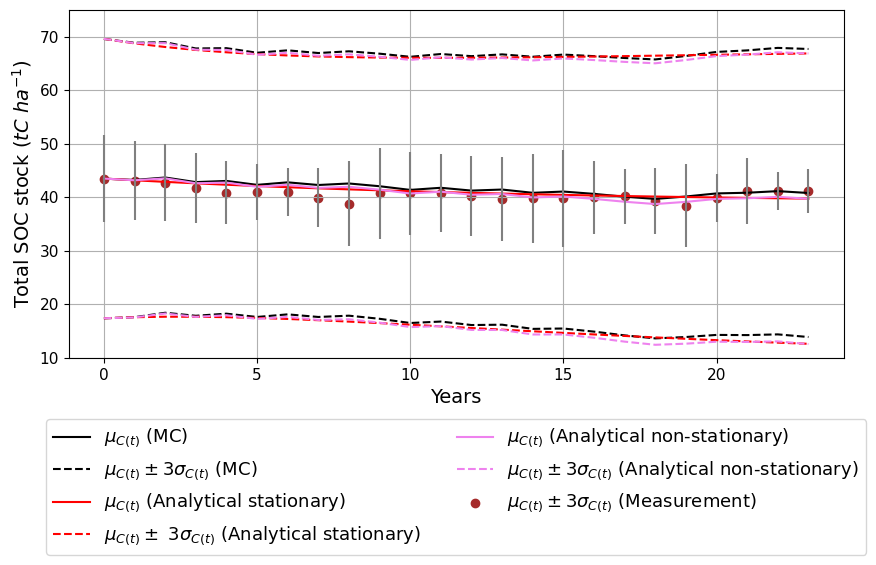

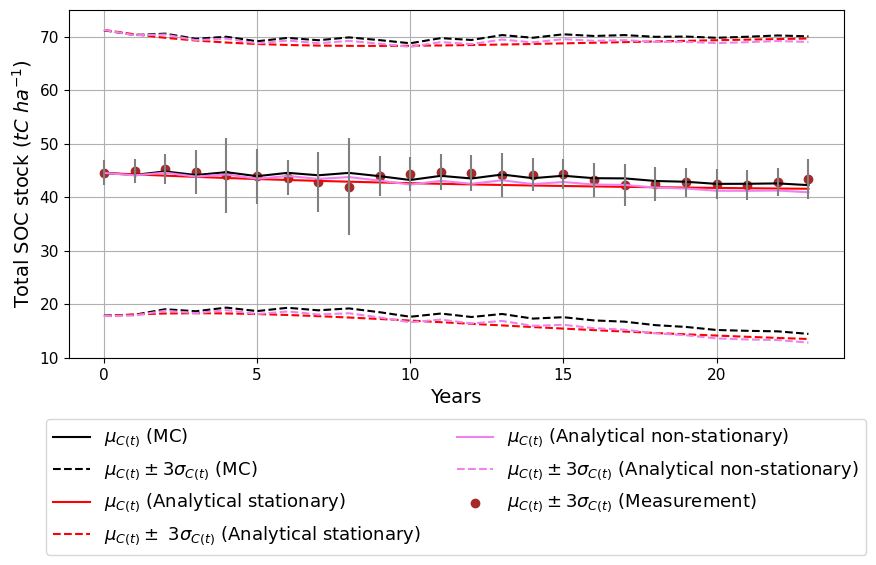

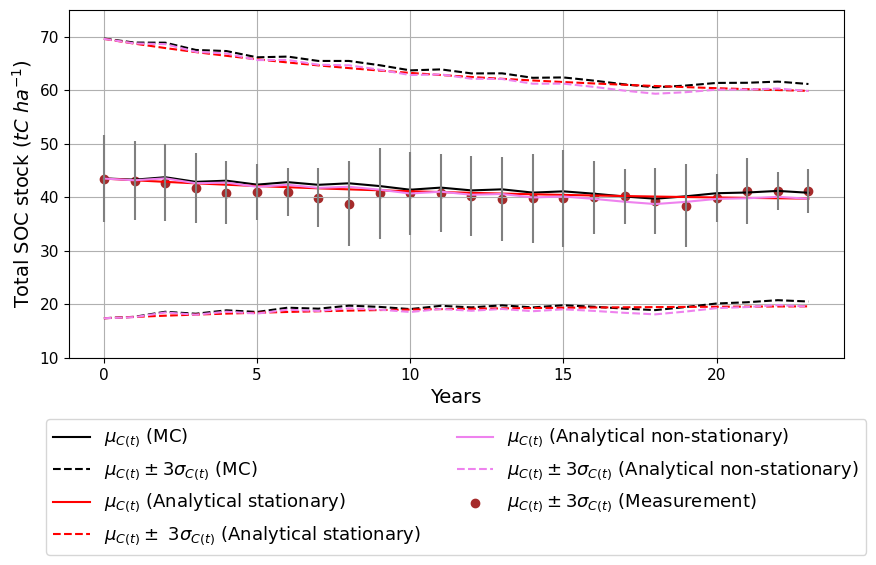

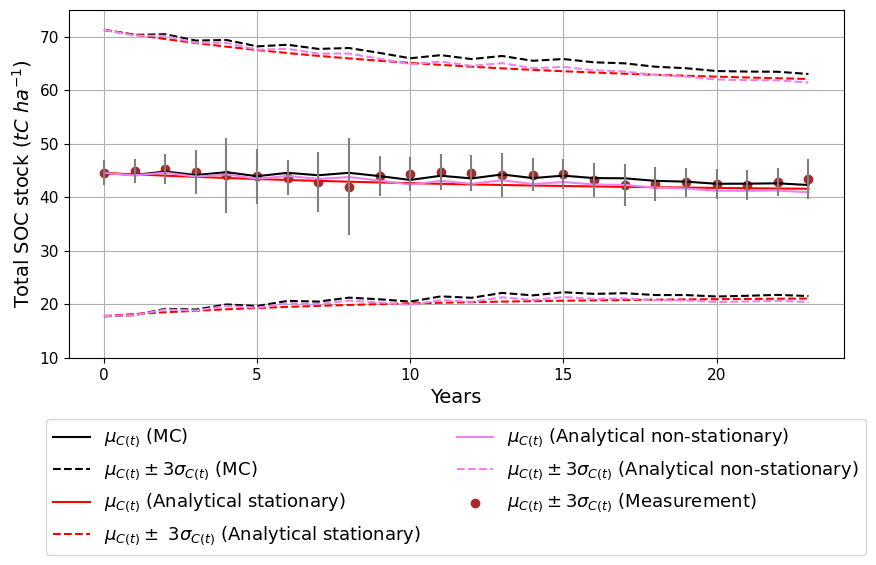

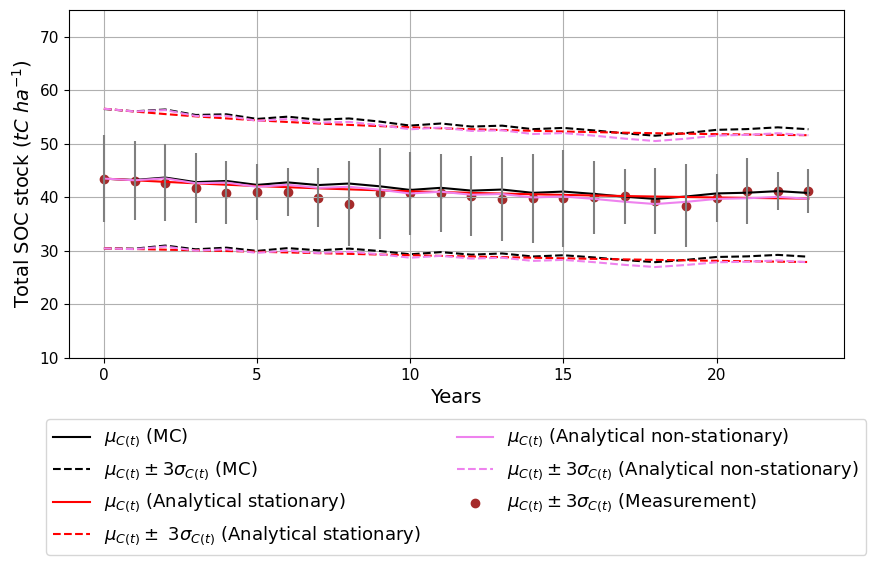

...

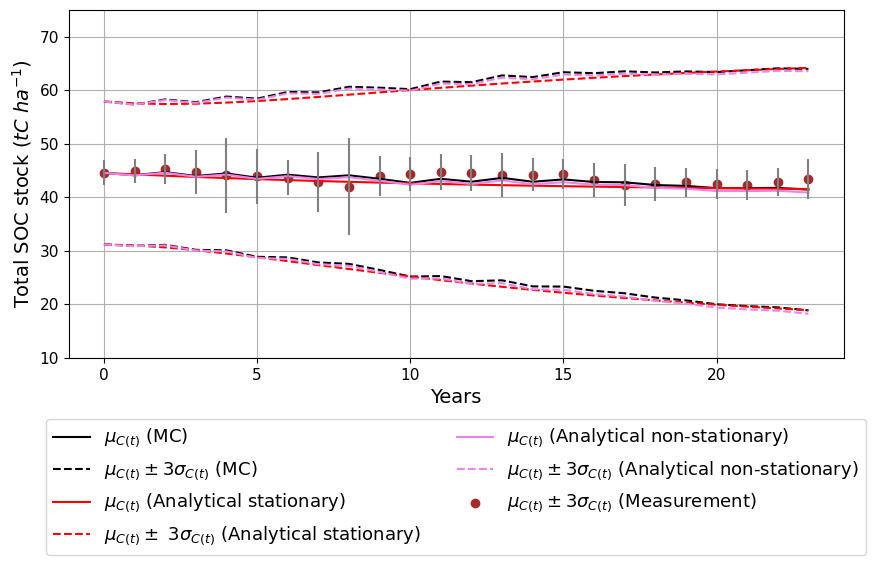

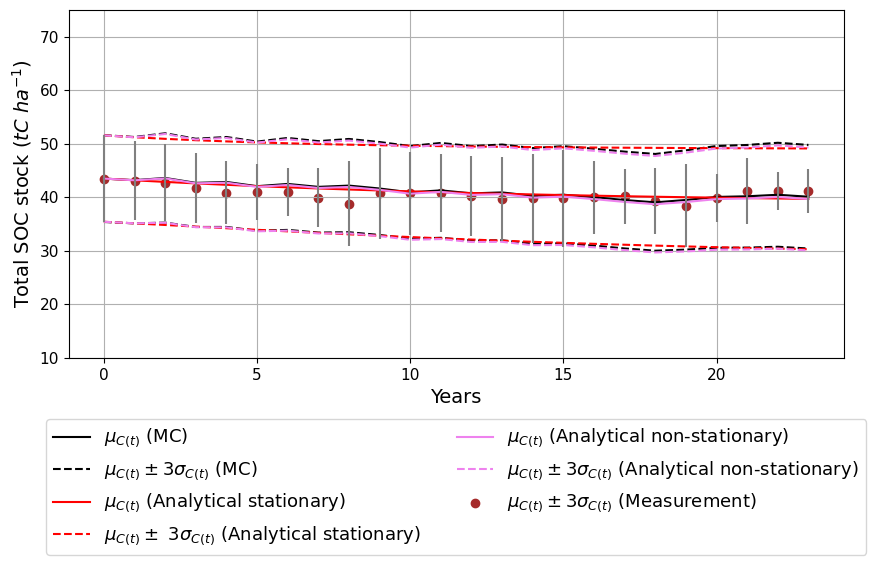

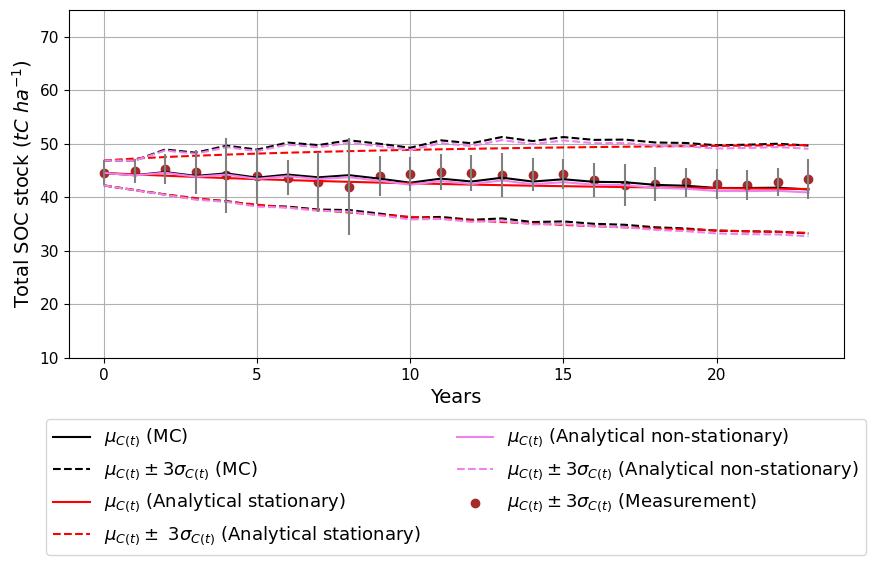

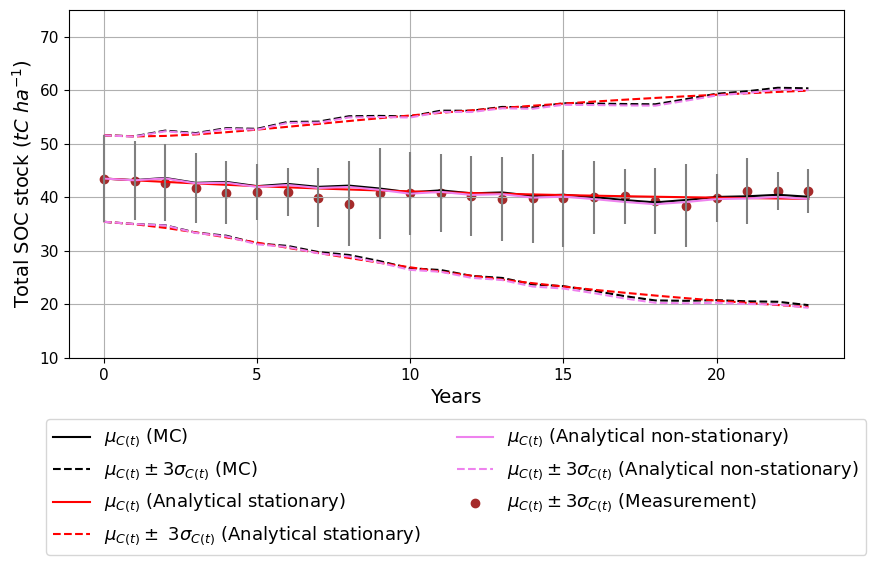

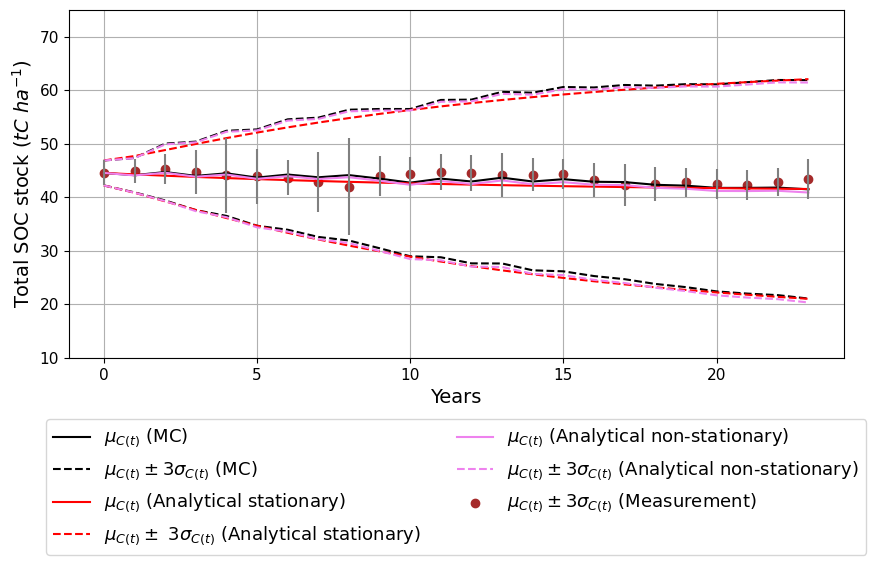

In [38]:
## Path to save figures, commented for now
dir_path_figures = '../figures/timeseries/absolute_SOC/'
# Create the repertory if needed
dir_path_figures = Path(dir_path_figures)
dir_path_figures.mkdir(parents=True, exist_ok=True)

## Path to save the dictionary containing the results of the analytical uncertainty propagation, 
    ## both stationary and non-stationary
dir_path_dict = '../outputs/result_analytical_method/absolute_SOC/'
# Create the repertory if needed
dir_path_dict = Path(dir_path_dict)
dir_path_dict.mkdir(parents=True, exist_ok=True)

# critical value for the confidence interval
z = 3

# dictionaries that will store the uncertainties over time
# relative uncertainty
sigma_rel_LEG = {}
sigma_rel_PRO = {}
# absolute uncertainty
sigma_LEG = {}
sigma_PRO = {}

# dictionaries that will store the expected values over time
mu_LEG={}
mu_PRO={}

# we loop over all the error scenario configurations
for name, (_, _) in configs.items():
    
    ## LEG
    plt.figure(figsize=(10, 6))

    # To plot the Monte Carlo solutions over time  
    plt.plot(QC_LUT_LEG[f'{name}_LEG']['E'],
         color='black', label='$\mu_{C(t)}$ (MC)')
    plt.plot(QC_LUT_LEG[f'{name}_LEG']['E'] + z * QC_LUT_LEG[f'{name}_LEG']['sigma'],
         color='black', linestyle='--', label='$\mu_{C(t)} \pm$'+str(z)+'$\sigma_{C(t)}$ (MC)')
    plt.plot(QC_LUT_LEG[f'{name}_LEG']['E'] - z * QC_LUT_LEG[f'{name}_LEG']['sigma'],
         color='black', linestyle='--')
    
    # To plot the analytical stationary solutions over time
    plt.plot(QC_const_analytic_LEG[f'{name}_LEG']['E'], color='red', 
             label='$\mu_{C(t)}$ (Analytical stationary)')
    plt.plot(QC_const_analytic_LEG[f'{name}_LEG']['E'] + z * QC_const_analytic_LEG[f'{name}_LEG']['sigma'],
             color='red', linestyle='--', label='$\mu_{C(t)} \pm$ '+str(z)+'$\sigma_{C(t)}$ (Analytical stationary)')
    plt.plot(QC_const_analytic_LEG[f'{name}_LEG']['E'] - z * QC_const_analytic_LEG[f'{name}_LEG']['sigma'], 
             color='red', linestyle='--')
   
    # To plot the analytical non-stationary ("vari") solutions over time
    plt.plot(QC_vari_t_analytic_LEG[f'{name}_LEG']['E'], color='violet',
             label='$\mu_{C(t)}$ (Analytical non-stationary)')
    plt.plot(QC_vari_t_analytic_LEG[f'{name}_LEG']['E'] + z * QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma'],
             color='violet', linestyle='--', 
             label='$\mu_{C(t)} \pm$'+str(z)+'$\sigma_{C(t)}$ (Analytical non-stationary)')
    plt.plot(QC_vari_t_analytic_LEG[f'{name}_LEG']['E'] - z * QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma'],
             color='violet', linestyle='--')
    
    # To plot the measurements from QualiAgro experiments
    plt.scatter(np.arange(t),mean_t_LEG['QC0'], color='brown', 
                label='$\mu_{C(t)} \pm$'+str(z)+'$\sigma_{C(t)}$ (Measurement)')

    plt.errorbar(np.arange(t), mean_t_LEG['QC0'],z*np.sqrt(data_LEG['Variance_SOC_stock'].values), 
                 fmt='none', ecolor='grey')

    
    plt.xlabel("Years")
    plt.ylabel("Total SOC stock ($tC~ha^{-1}$)")
    #plt.title(f'LEG - Comparison MC vs stationary vs non-stationary (I and k) uncertainty on total SOC stock for {name}')
    plt.grid(True)
    plt.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.15),
        ncol=2
    )
    plt.ylim((10,75))

    plt.subplots_adjust(bottom=0.3)

    plt.savefig(dir_path_figures / f'sigma_SOC_{name}_LEG.png',bbox_inches="tight", dpi=300)
    plt.show()

    # We save the uncertainty estimated (the sigma's vector) per error scenario configuration,
    # in a dictionary, organised by the analytical methods, either stationary or non-stationary called 'vari'
    
    # the relative uncertainty
    sigma_rel_LEG[f'{name}_LEG']={}
    sigma_rel_LEG[f'{name}_LEG']['stationary'] = QC_const_analytic_LEG[f'{name}_LEG']['sigma']/QC_const_analytic_LEG[f'{name}_LEG']['E']
    sigma_rel_LEG[f'{name}_LEG']['vari'] = QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma']/QC_vari_t_analytic_LEG[f'{name}_LEG']['E']

    # the absolute uncertainty
    sigma_LEG[f'{name}_LEG']={}
    sigma_LEG[f'{name}_LEG']['stationary'] = QC_const_analytic_LEG[f'{name}_LEG']['sigma']
    sigma_LEG[f'{name}_LEG']['vari'] = QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma']
    
    # the expected value
    mu_LEG[f'{name}_LEG']={}
    mu_LEG[f'{name}_LEG']['stationary'] = QC_const_analytic_LEG[f'{name}_LEG']['E']
    mu_LEG[f'{name}_LEG']['vari'] = QC_vari_t_analytic_LEG[f'{name}_LEG']['E']

        
        
    ## PRO
    
    plt.figure(figsize=(10, 6))
    
    # To plot the Monte Carlo solutions over time  
    plt.plot(QC_LUT_PRO[f'{name}_PRO']['E'],
         color='black', label='$\mu_{C(t)}$ (MC)')
    plt.plot(QC_LUT_PRO[f'{name}_PRO']['E'] + z * QC_LUT_PRO[f'{name}_PRO']['sigma'],
         color='black', linestyle='--', label='$\mu_{C(t)} \pm$'+str(z)+'$\sigma_{C(t)}$ (MC)')
    plt.plot(QC_LUT_PRO[f'{name}_PRO']['E'] - z * QC_LUT_PRO[f'{name}_PRO']['sigma'],
         color='black', linestyle='--')
             
    # To plot the analytical stationary solutions over time
    plt.plot(QC_const_analytic_PRO[f'{name}_PRO']['E'], 
             color='red', label='$\mu_{C(t)}$ (Analytical stationary)')
    plt.plot(QC_const_analytic_PRO[f'{name}_PRO']['E'] + z * QC_const_analytic_PRO[f'{name}_PRO']['sigma'],
             color='red', linestyle='--', label='$\mu_{C(t)} \pm$ '+str(z)+'$\sigma_{C(t)}$ (Analytical stationary)')
    plt.plot(QC_const_analytic_PRO[f'{name}_PRO']['E'] - z * QC_const_analytic_PRO[f'{name}_PRO']['sigma'], 
             color='red', linestyle='--')
    
    # To plot the analytical non-stationary ('vari') solutions over time
    plt.plot(QC_vari_t_analytic_PRO[f'{name}_PRO']['E'], color='violet', 
             label='$\mu_{C(t)}$ (Analytical non-stationary)')
    plt.plot(QC_vari_t_analytic_PRO[f'{name}_PRO']['E'] + z * QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma'],
             color='violet', linestyle='--', 
             label='$\mu_{C(t)} \pm$'+str(z)+'$\sigma_{C(t)}$ (Analytical non-stationary)')
    plt.plot(QC_vari_t_analytic_PRO[f'{name}_PRO']['E'] - z * QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma'], 
             color='violet', linestyle='--')
    
    # To plot the measurements from QualiAgro experiments
    plt.scatter(np.arange(t),mean_t_PRO['QC0'], color='brown',
                label='$\mu_{C(t)} \pm$'+str(z)+'$\sigma_{C(t)}$ (Measurement)')

    plt.errorbar(np.arange(t), mean_t_PRO['QC0'],z*np.sqrt(data_PRO['Variance_SOC_stock'].values), 
                 fmt='none', ecolor='grey')

    plt.xlabel("Years")
    plt.ylabel("Total SOC stock ($tC~ha^{-1}$)")
    #plt.title(f'PRO - Comparison MC vs stationary vs non-stationary (I and k) uncertainty on total SOC stock for {name}')
    plt.grid(True)
    plt.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.15),
        ncol=2
    )
    plt.ylim((10,75))
    plt.subplots_adjust(bottom=0.3)

    plt.savefig(dir_path_figures / f'sigma_SOC_{name}_PRO.png',bbox_inches="tight", dpi=300)

    plt.show()
    
    # We save the uncertainty estimated (the sigma's vector) per error scenario configuration,
    # in a dictionary, organised by the analytical methods, either stationary or non-stationary called 'vari'
    
    # the relative uncertainty
    sigma_rel_PRO[f'{name}_PRO']={}
    sigma_rel_PRO[f'{name}_PRO']['stationary'] = QC_const_analytic_PRO[f'{name}_PRO']['sigma']/QC_const_analytic_PRO[f'{name}_PRO']['E']
    sigma_rel_PRO[f'{name}_PRO']['vari'] = QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma']/QC_vari_t_analytic_PRO[f'{name}_PRO']['E']

    # the absolute uncertainty
    sigma_PRO[f'{name}_PRO']={}
    sigma_PRO[f'{name}_PRO']['stationary'] = QC_const_analytic_PRO[f'{name}_PRO']['sigma']
    sigma_PRO[f'{name}_PRO']['vari'] = QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma']
    
    # the expected value
    mu_PRO[f'{name}_PRO']={}
    mu_PRO[f'{name}_PRO']['stationary'] = QC_const_analytic_PRO[f'{name}_PRO']['E']
    mu_PRO[f'{name}_PRO']['vari'] = QC_vari_t_analytic_PRO[f'{name}_PRO']['E']

    
# We save all dictionaries in pickles 
with open(dir_path_dict/"sigma_rel_LEG.pkl", "wb") as f:
    pickle.dump(sigma_rel_LEG, f)

with open(dir_path_dict/"sigma_rel_PRO.pkl", "wb") as f:
    pickle.dump(sigma_rel_PRO, f)

with open(dir_path_dict/"mu_LEG.pkl", "wb") as f:
    pickle.dump(mu_LEG, f)

with open(dir_path_dict/"sigma_LEG.pkl", "wb") as f:
    pickle.dump(sigma_LEG, f)
        
with open(dir_path_dict/"sigma_PRO.pkl", "wb") as f:
    pickle.dump(sigma_PRO, f)

with open(dir_path_dict/"mu_PRO.pkl", "wb") as f:
    pickle.dump(mu_PRO, f)


### Reduced dataset by keeping only opti and pessim error scenario configuration

In [20]:
keywords = ["opti", "pessim"]
sigma_LEG_opti_pessim = {k: v for k, v in sigma_LEG.items() if any(word in k for word in keywords)}
sigma_PRO_opti_pessim = {k: v for k, v in sigma_PRO.items() if any(word in k for word in keywords)}

sigma_rel_LEG_opti_pessim = {k: v for k, v in sigma_rel_LEG.items() if any(word in k for word in keywords)}
sigma_rel_PRO_opti_pessim = {k: v for k, v in sigma_rel_PRO.items() if any(word in k for word in keywords)}



## Evolution of the uncertainty of the absolute $SOC_{stock}$ $C(t)$ (Fig. 8, S8 and S9)

### In absolute uncertainty ($\sigma_{C(t)}$ (in tC/ha))

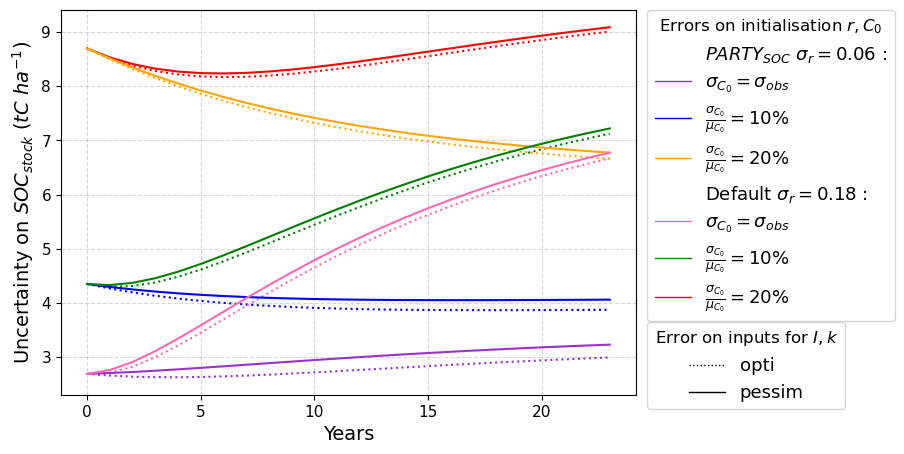

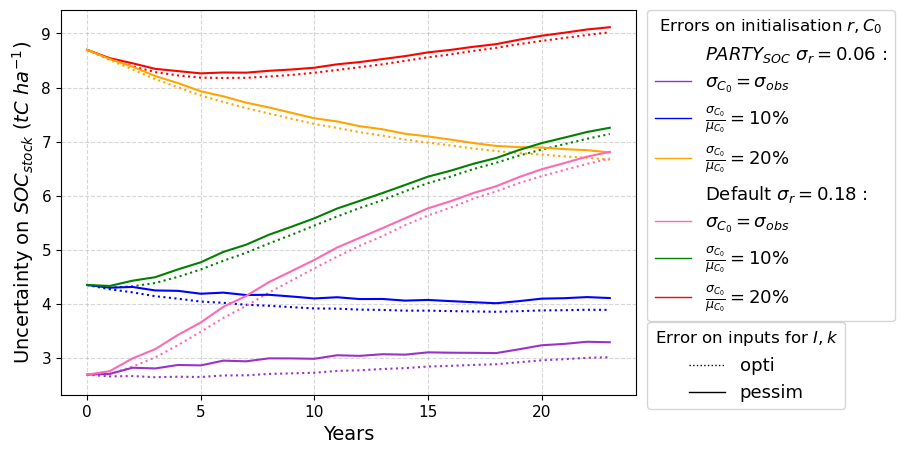

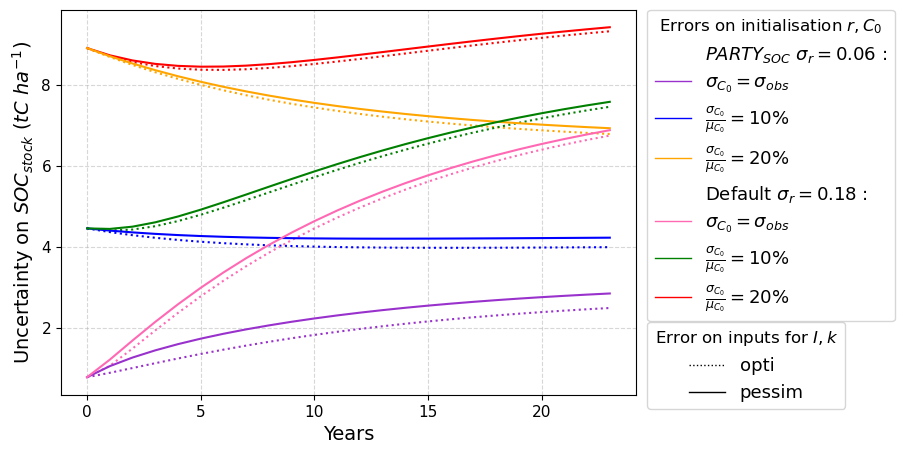

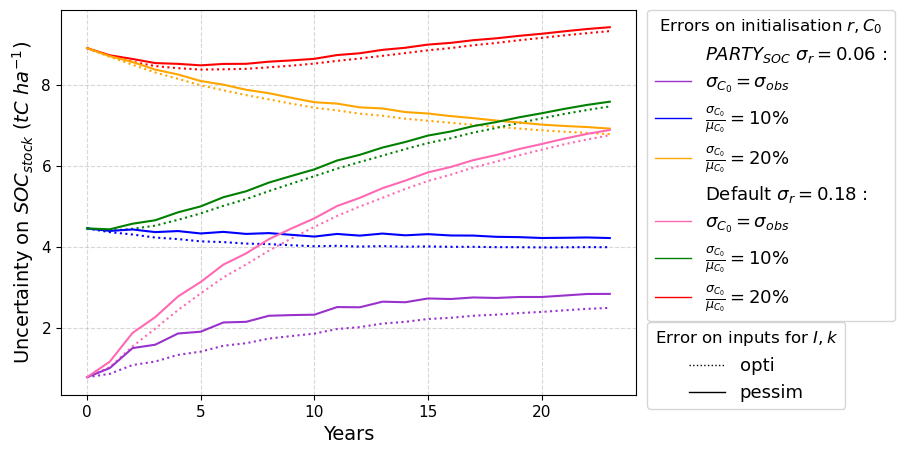

In [34]:
# dictionary that defines the legend names
# according to the error scenario configuration 

label_map = {
    'local':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.06$',
    'large':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.18$',
    'localdef': r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.18$',
    'largeRE':  r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.06$',
    'mesdef': r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.18$',
    'mesRE':  r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.06$',
    'opti' :'opti',
    'pessim':'pessim'
}  


# dictionary that defines the color of the curve according to the error scenario configuration for initial conditions
color_map_dict = {'local' : 'blue', 'large': 'red', 'largeRE':'orange', 'localdef':'green', 
                  'mesRE':'darkorchid', 'mesdef':'hotpink'}

# dictionary that defines the linestyle of the curve according to the error scenario configuration 
# for intermediate variables I and k
style_map_dict = {'opti':'dotted', 'pessim':'solid'}

# directory to save the fig, for now the line savefig is commented in the function
dir_path_figures = '../figures/uncertainty_evolution/absolute_SOC/opti_pessim/'

# Axis label
ylabel = 'Uncertainty on $SOC_{stock}$ ($tC~ha^{-1}$)'
xlabel ='Years'


## Call the function to plot

# LEG - Evolution of SOC stock uncertainty for stationary case
plot_sigma(
    sigma_LEG_opti_pessim,
    key='stationary',
    dir_path=dir_path_figures,
    title='LEG - Evolution of SOC stock uncertainty for stationary case',
    filename='LEG_evolution_stationary_uncertainty_all_scenario.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

# LEG - Evolution of SOC stock uncertainty for non-stationary case
plot_sigma(
    sigma_LEG_opti_pessim,
    key='vari',
    dir_path=dir_path_figures,
    title='LEG - Evolution of SOC stock uncertainty for non-stationary case',
    filename='LEG_evolution_vari_uncertainty_all_scenario.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

# PRO - Evolution of SOC stock uncertainty for stationary case
plot_sigma(
    sigma_PRO_opti_pessim,
    key='stationary',
    dir_path=dir_path_figures,
    title='PRO - Evolution of SOC stock uncertainty for stationary case',
    filename='PRO_evolution_stationary_uncertainty_all_scenario.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

# PRO - Evolution of SOC stock uncertainty for non-stationary case
plot_sigma(
    sigma_PRO_opti_pessim,
    key='vari',
    dir_path=dir_path_figures,
    title='PRO - Evolution of SOC stock uncertainty for non-stationary case',
    filename='PRO_evolution_vari_uncertainty_all_scenario.png',
    ylabel=ylabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

### In relative uncertainty ($\frac{\mu_{C(t)}}{\sigma_{C(t)}}$ (%))

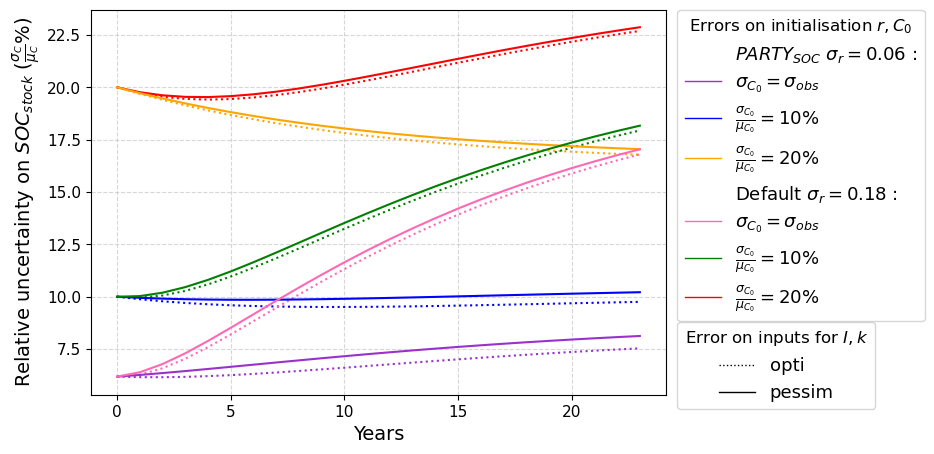

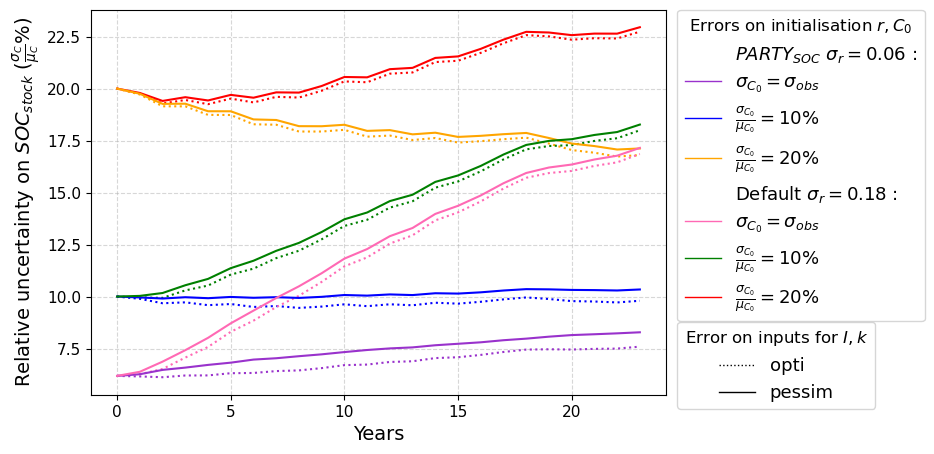

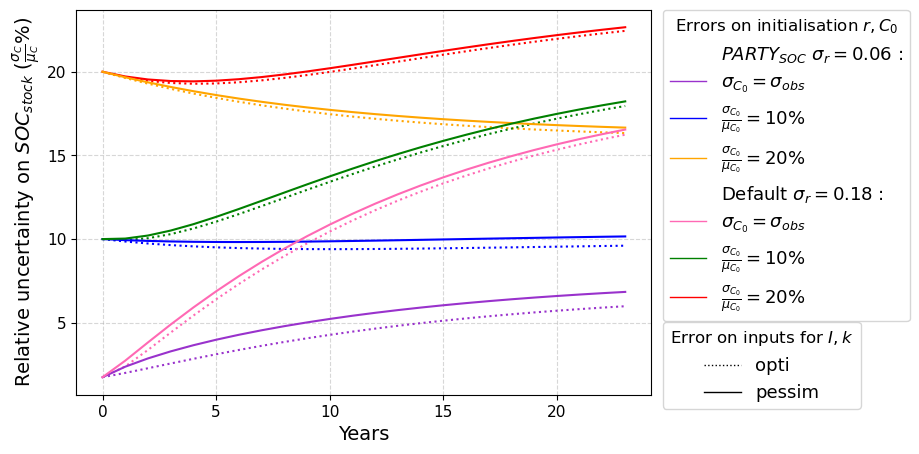

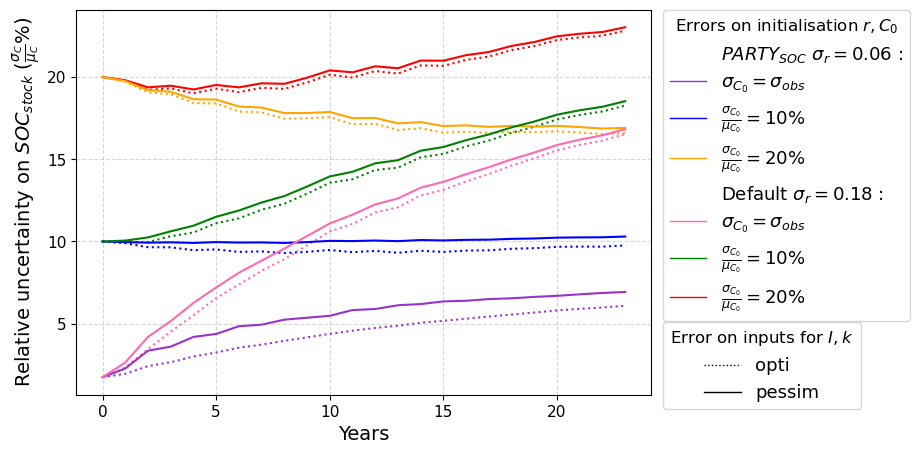

In [35]:
# dictionary that defines the legend namess 
# according to the error scenario configuration 

label_map = {
    'local':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.06$',
    'large':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.18$',
    'localdef': r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.18$',
    'largeRE':  r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.06$',
    'mesdef': r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.18$',
    'mesRE':  r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.06$',
    'opti' :'opti',
    'pessim':'pessim'
}  


# dictionary that defines the color of the curve according to the error scenario configuration for initial conditions
color_map_dict = {'local' : 'blue', 'large': 'red', 'largeRE':'orange', 'localdef':'green', 
                  'mesRE':'darkorchid', 'mesdef':'hotpink'}

# dictionary that defines the linestyle of the curve according to the error scenario configuration 
# for intermediate variables I and k
style_map_dict = {'opti':'dotted', 'pessim':'solid'}

# directory to save the fig, for now the line savefig is commented in the function
dir_path_figures = '../figures/uncertainty_evolution/absolute_SOC/opti_pessim/'

# Axis labels
ylabel=r'Relative uncertainty on $SOC_{stock}$ ($\frac{\sigma_{C}}{\mu_{C}} \%$)'
xlabel='Years'

## Call the function to plot

# LEG - Evolution of SOC stock relative uncertainty for stationary case
plot_sigma_percent(
    sigma_rel_LEG_opti_pessim,
    key='stationary',
    dir_path=dir_path_figures,
    title='LEG - Evolution of SOC stock relative uncertainty for stationary case',
    filename='LEG_evolution_stationary_relative_uncertainty_all_scenario_percent.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

# LEG - Evolution of SOC stock relative uncertainty for non-stationary case
plot_sigma_percent(
    sigma_rel_LEG_opti_pessim,
    key='vari',
    dir_path=dir_path_figures,
    title='LEG - Evolution of SOC stock relative uncertainty for non-stationary case',
    filename='LEG_evolution_vari_relative_uncertainty_all_scenario_percent.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

# PRO - Evolution of SOC stock relative uncertainty for stationary case
plot_sigma_percent(
    sigma_rel_PRO_opti_pessim,
    key='stationary',
    dir_path=dir_path_figures,
    title='PRO - Evolution of SOC stock relative uncertainty for stationary case',
    filename='PRO_evolution_stationary_relative_uncertainty_all_scenario_percent.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

# PRO - Evolution of SOC stock relative uncertainty for non-stationary case
plot_sigma_percent(
    sigma_rel_PRO_opti_pessim,
    key='vari',
    dir_path=dir_path_figures,
    title='PRO - Evolution of SOC stock relative uncertainty for non-stationary case',
    filename='PRO_evolution_vari_relative_uncertainty_all_scenario_percent.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

## Supplemental figures : Differences of uncertainty engendered by different error scenario for AMG inputs to compute uncertainties of carbon inputs ($\sigma_{I}$) and mineralisation rate ($\sigma_{k}$) (Fig. S10 and S11)

/tmp/ipykernel_89321/3446676304.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(9, 4.5))


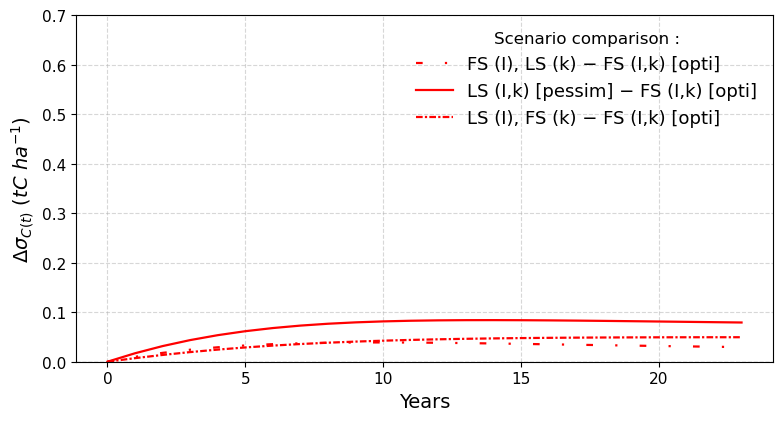

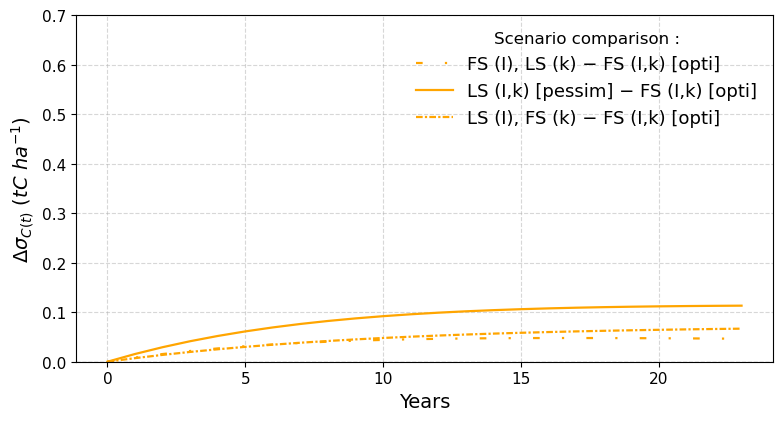

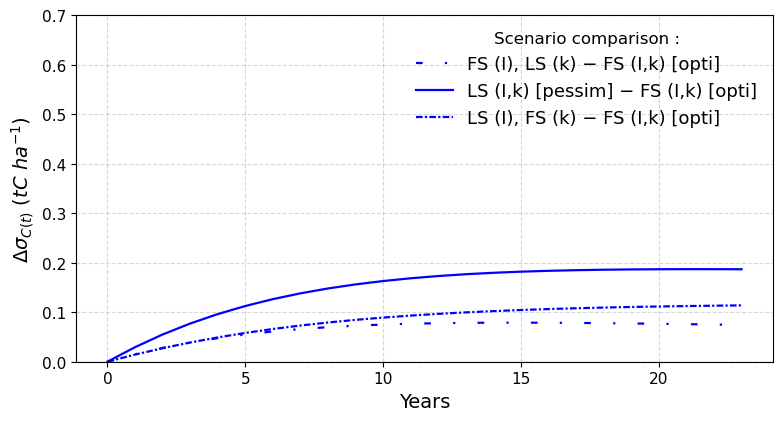

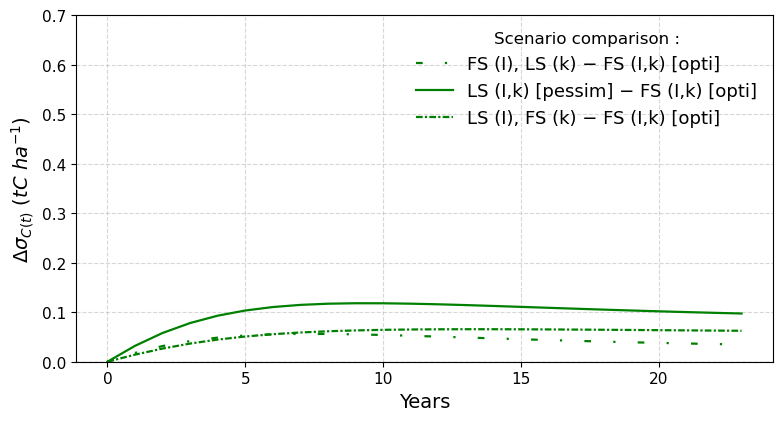

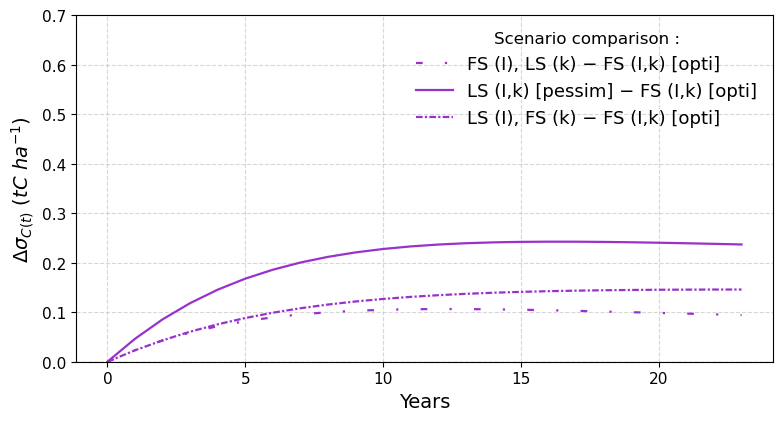

...

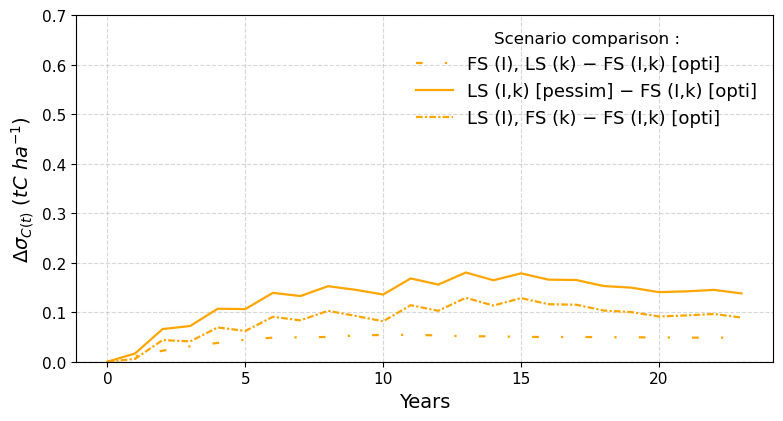

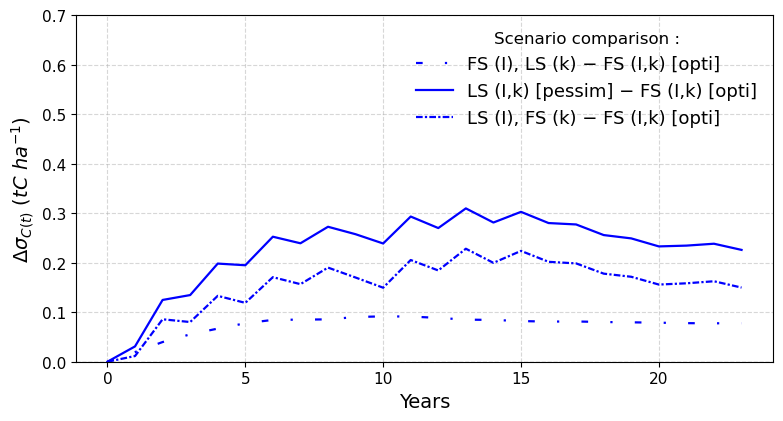

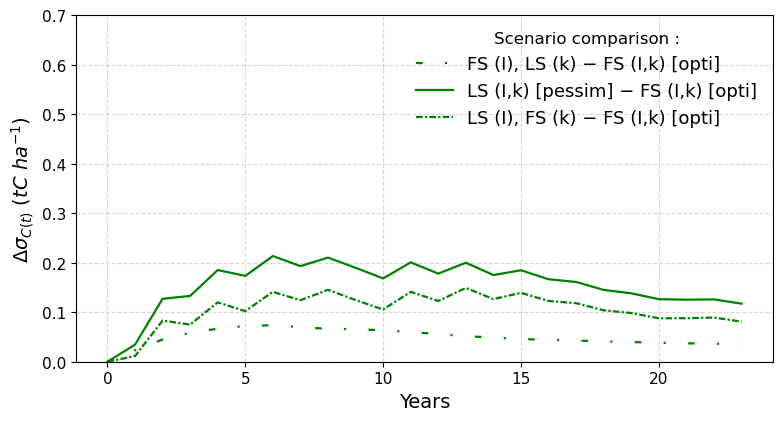

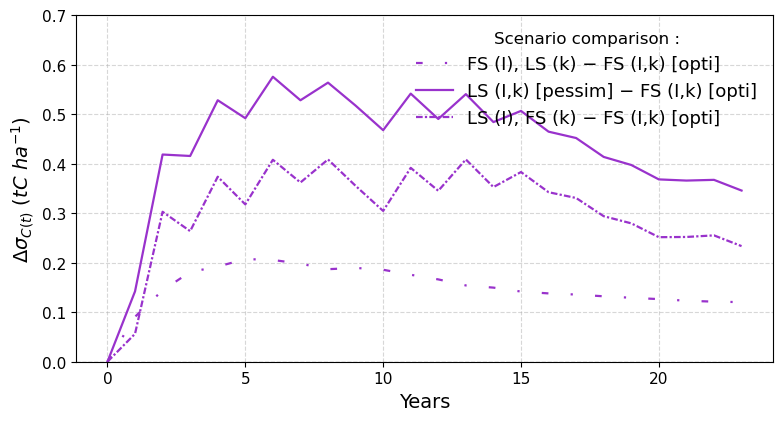

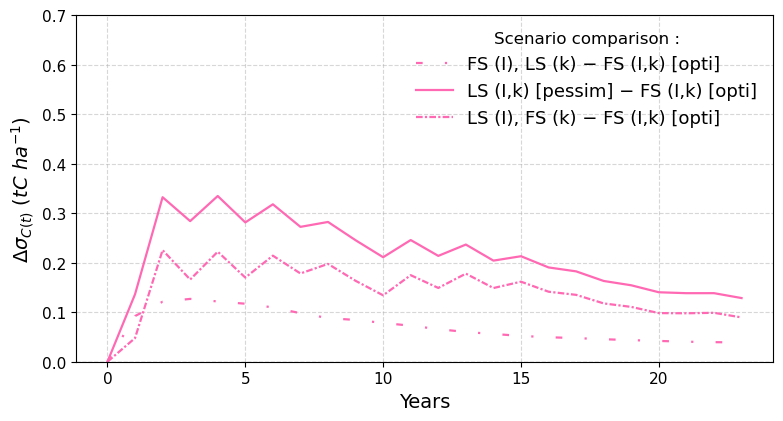

In [23]:
# Same color code and legend code as previous graph
label_map = {
    'local':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.06$',
    'large':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.18$',
    'localdef': r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.18$',
    'largeRE':  r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.06$',
    'mesdef': r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.18$',
    'mesRE':  r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.06$',
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    
}  

color_map_dict = {'local' : 'blue', 'large': 'red', 'largeRE':'orange', 'localdef':'green', 'mesRE':'darkorchid', 'mesdef':'hotpink'}
style_map_dict = {'opti':'dotted', 'pessim':'solid', 'ACEOkLS':(0,(3,10,1,10)), 'regstatk10': (0,(3,1,1,1))}


dir_path_figures = '../figures/uncertainty_evolution/absolute_SOC/diff_uncertainty_vs_opti_individual_plot_per_init/'

xlabel='Years'


#LEG plots - Differences of SOCstock uncertainty (tC\ha) between a given error scenario for $I,k$ 
# and the reference scenario `opti'. Stationary case.

"""
Each graph corresponds to an initialisation error scenario.
FS for "Field-scale" and LS for "Large-scale" error scenarios.
"""
plot_sigma_diff_by_C0r_reference(
    sigma_LEG,
    xlabel,
    reference='opti',
    key='stationary',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{C(t)} ~(tC~ha^{-1})$',
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)

#LEG plots - Differences of SOCstock uncertainty (tC\ha) between a given error scenario for $I,k$ 
# and the reference scenario `opti'. Non- stationary case.

"""
Each graph corresponds to an initialisation error scenario.
FS for "Field-scale" and LS for "Large-scale" error scenarios.
"""

plot_sigma_diff_by_C0r_reference(
    sigma_LEG,
    xlabel,
    reference='opti',
    key='vari',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{C(t)} ~(tC~ha^{-1})$',
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)


#PRO plots - Differences of SOCstock uncertainty (tC\ha) between a given error scenario for $I,k$ 
# and the reference scenario `opti'. Stationary case.

"""
Each graph corresponds to an initialisation error scenario.
FS for "Field-scale" and LS for "Large-scale" error scenarios.
"""
plot_sigma_diff_by_C0r_reference(
    sigma_PRO,
    xlabel,
    reference='opti',
    key='stationary',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{C(t)} ~(tC~ha^{-1})$',
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)

#PRO plots - Differences of SOCstock uncertainty (tC\ha) between a given error scenario for $I,k$ 
# and the reference scenario `opti'. Non- stationary case.

"""
Each graph corresponds to an initialisation error scenario.
FS for "Field-scale" and LS for "Large-scale" error scenarios.
"""

plot_sigma_diff_by_C0r_reference(
    sigma_PRO,
    xlabel,
    reference='opti',
    key='vari',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{C(t)} ~(tC~ha^{-1})$',
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)




# Figures for $\Delta SOC_{stock}$ over time

# Timeseries of temporal $\Delta SOC_{stock} (t-t0)$ and its uncertainty (Fig. 11, S12 and S13)

We plot a graphic for each error scenario configuration, for each treatment (LEG and PRO). We plot the evolution of the expected SOC stock change in time $\mu_{\Delta C(t)}$ with its envelope $\mu_{\Delta C(t)} \pm z \sigma_{\Delta C(t)}$. With z the critical value. Here we use z = 3.
In addition, we plot the $\Delta C(t)$ observed based on measurements from QualiAgro.

In [24]:
# we get the observed Delta SOC stock based on measurements
# the uncertainty is computed based on the sum of variance

obs_Delta_LEG={}
obs_Delta_LEG['E'] = mean_t_LEG['QC0'] - mean_t_LEG['QC0'][0]
obs_Delta_LEG['sigma'] = np.sqrt(data_LEG['Variance_SOC_stock'].values + data_LEG['Variance_SOC_stock'].values[0])
obs_Delta_LEG['sigma'][0]=0

obs_Delta_PRO={}
obs_Delta_PRO['E'] = mean_t_PRO['QC0'] - mean_t_PRO['QC0'][0]
obs_Delta_PRO['sigma'] = np.sqrt(data_PRO['Variance_SOC_stock'].values + data_PRO['Variance_SOC_stock'].values[0])
obs_Delta_PRO['sigma'][0]=0

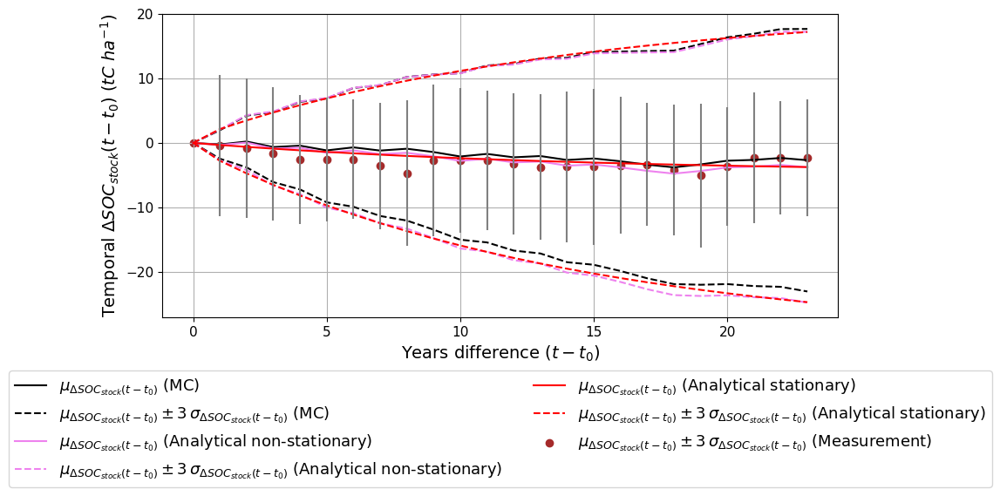

/tmp/ipykernel_89321/689472616.py:105: RuntimeWarning: invalid value encountered in divide
  'stationary': Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['sigma'] / Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['E'],
/tmp/ipykernel_89321/689472616.py:106: RuntimeWarning: invalid value encountered in divide
  'vari': Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma'] / Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['E']


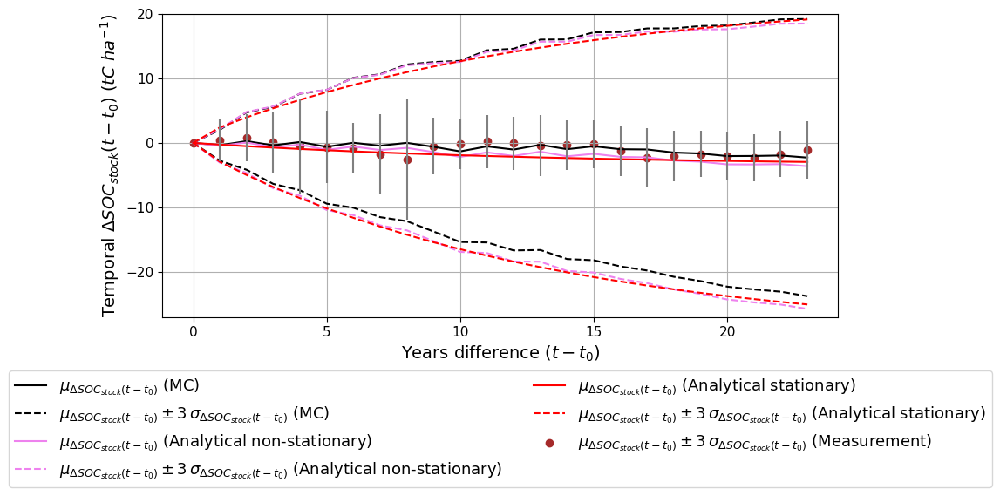

/tmp/ipykernel_89321/689472616.py:204: RuntimeWarning: invalid value encountered in divide
  'stationary': Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['sigma'] / Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['E'],
/tmp/ipykernel_89321/689472616.py:205: RuntimeWarning: invalid value encountered in divide
  'vari': Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma'] / Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['E']


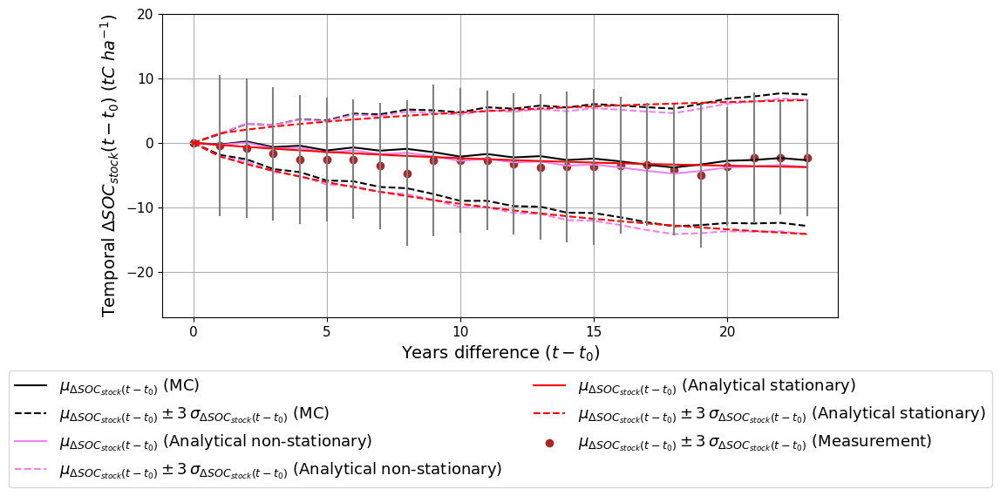

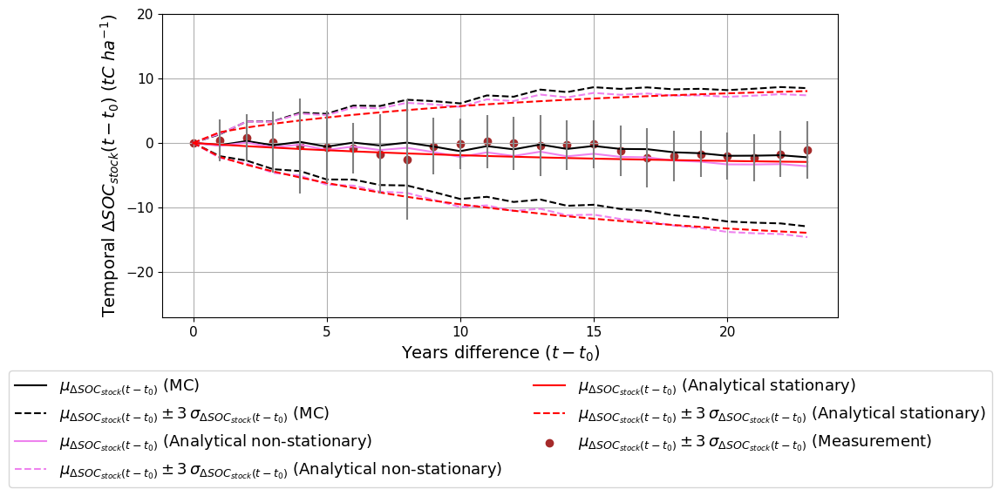

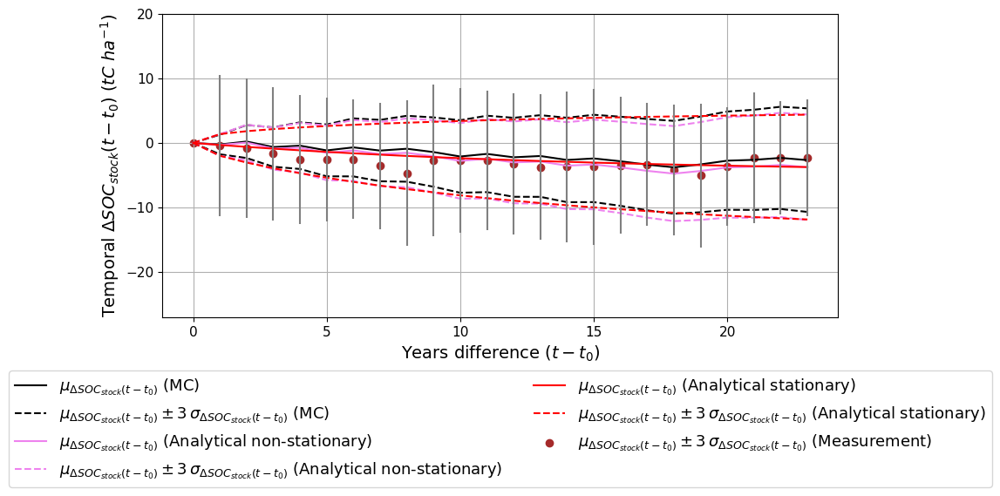

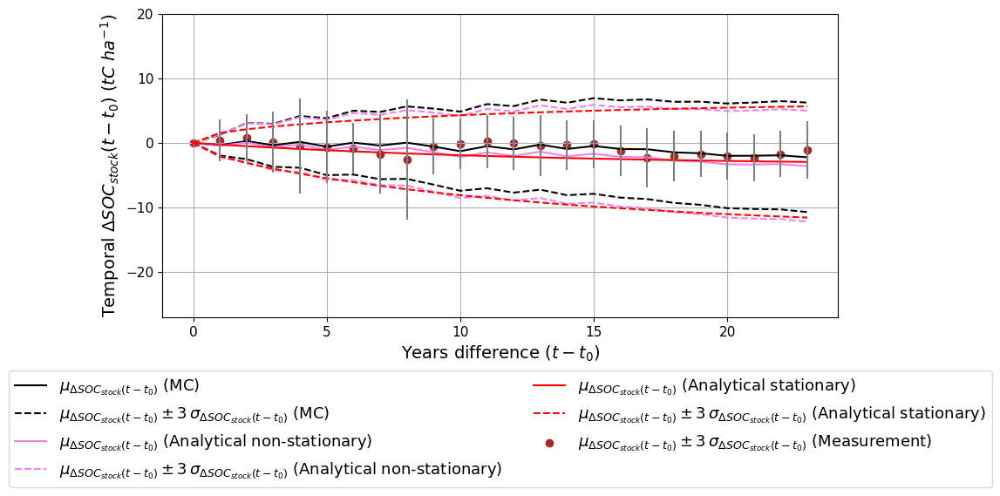

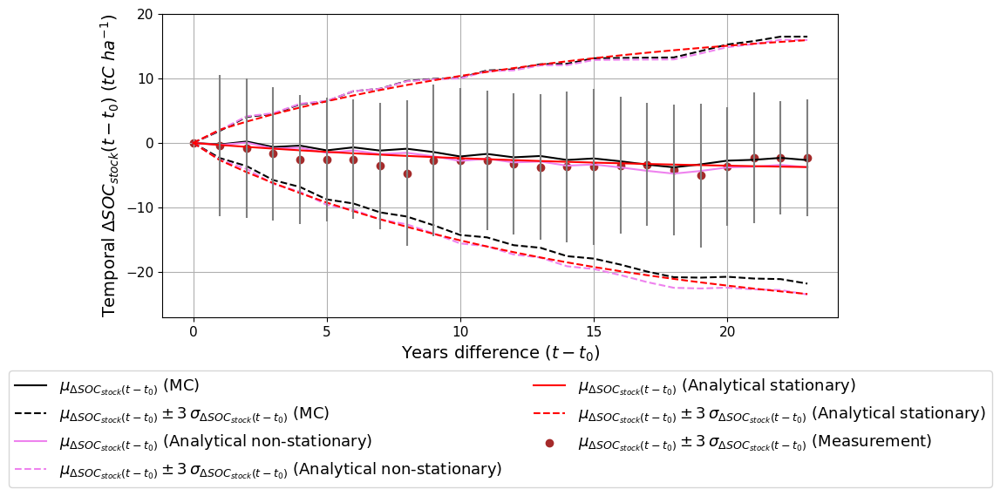

...

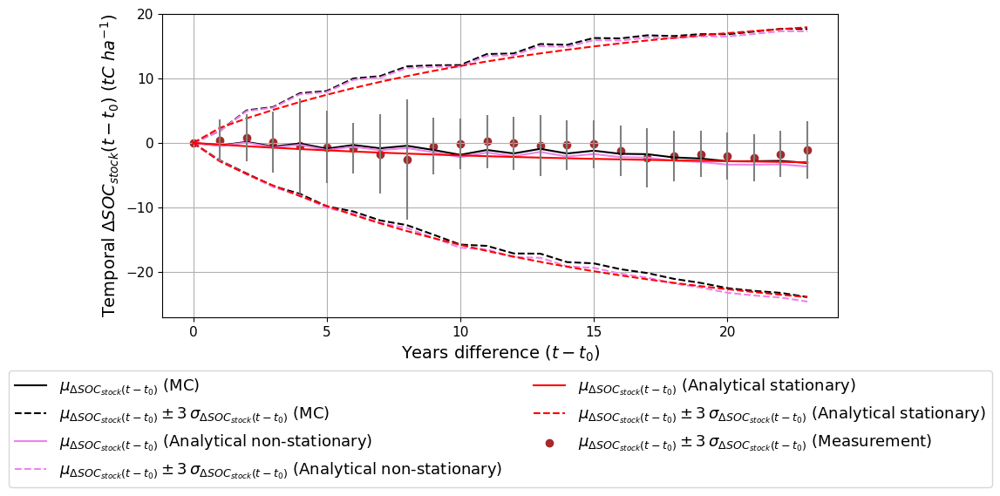

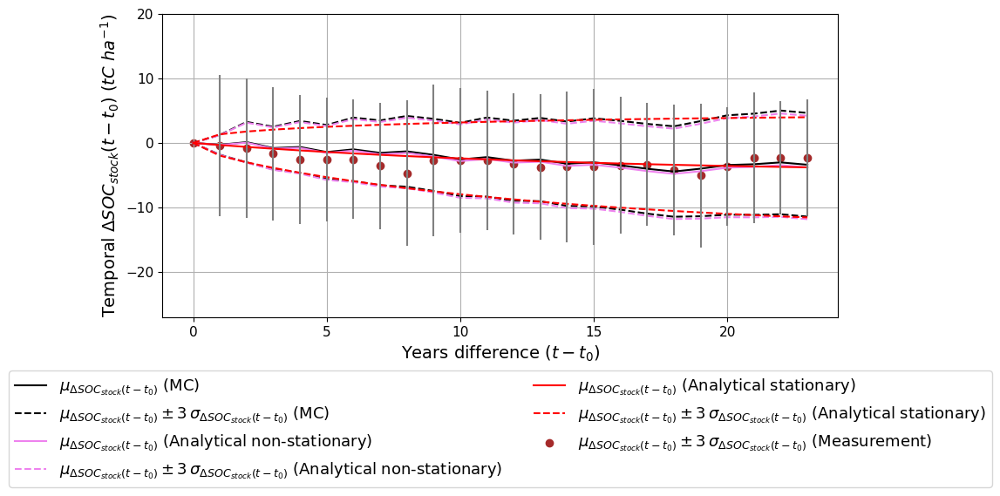

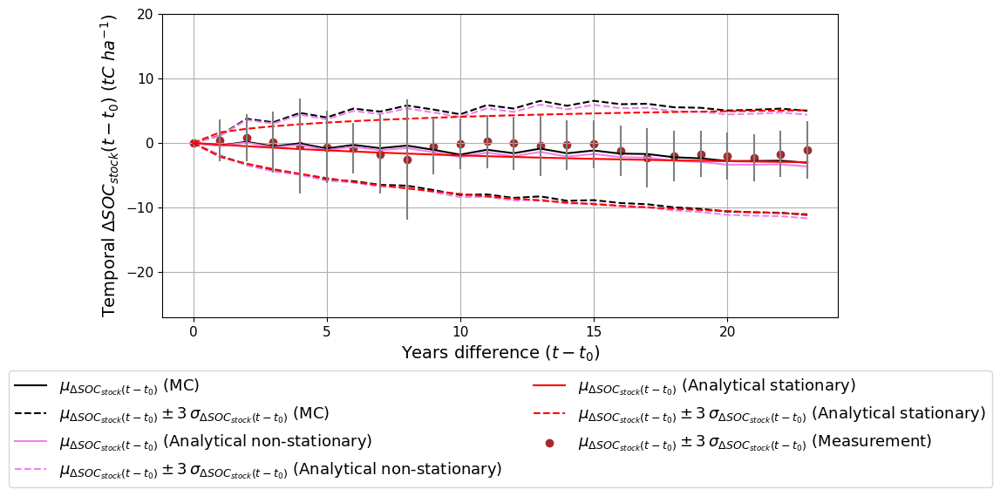

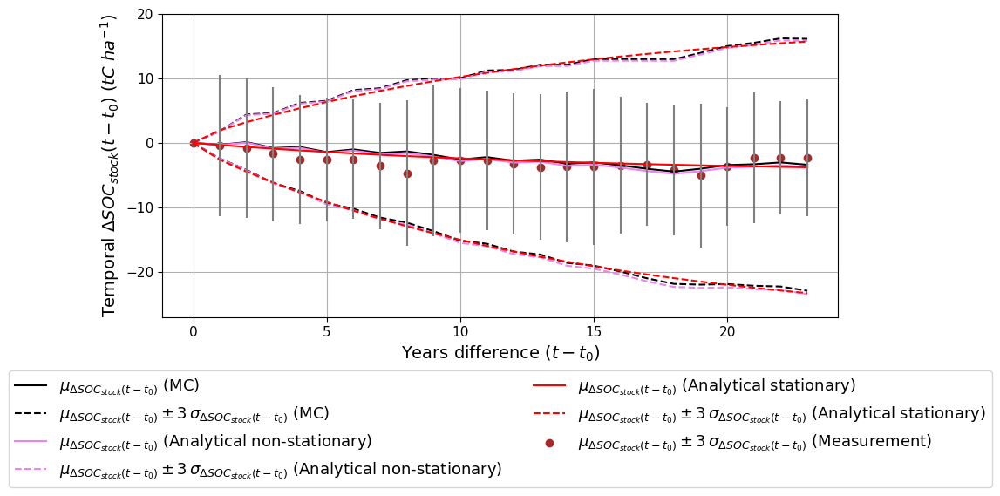

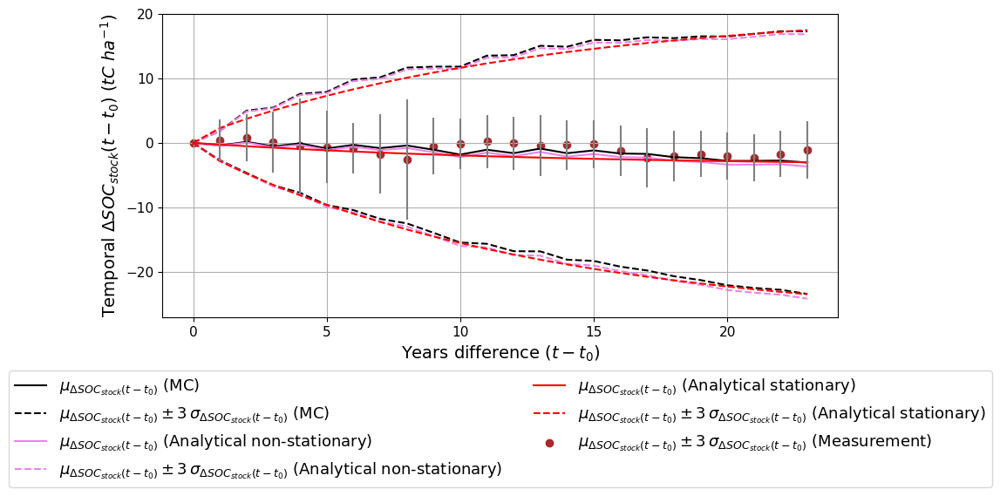

In [37]:
# critial value for confidence interval
z=3

# dictionaries that will store the uncertainties over time
sigma_Delta_rel_LEG = {}
sigma_Delta_rel_PRO = {}

sigma_Delta_LEG = {}
sigma_Delta_PRO = {}

## Path to save the figures, savefig() commented for now
dir_path_figures = '../figures/timeseries/temporal_delta_SOC/'
# Create the repertory if needed
dir_path_figures = Path(dir_path_figures)
dir_path_figures.mkdir(parents=True, exist_ok=True)
    
## Path to save the dictionary containing the results of the analytical uncertainty propagation, 
    ## both stationary and non-stationary
dir_path_dict = '../outputs/result_analytical_method/temporal_delta_SOC/'

# we loop over all the error scenario configurations
for name, (_, _) in configs.items():
    
    ## LEG
    plt.figure(figsize=(10, 6))

    # To plot the Monte Carlo solutions over time
    plt.plot(
        Delta_QC_LUT_LEG[f'{name}_LEG']['E'],
        color='black',
        label=r'$\mu_{\Delta SOC_{stock} (t-t_0)}$ (MC)'
    )
    plt.plot(
        Delta_QC_LUT_LEG[f'{name}_LEG']['E'] + z * Delta_QC_LUT_LEG[f'{name}_LEG']['sigma'],
        color='black',
        linestyle='--',
        label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (MC)'
    )
    plt.plot(
        Delta_QC_LUT_LEG[f'{name}_LEG']['E'] - z * Delta_QC_LUT_LEG[f'{name}_LEG']['sigma'],
        color='black',
        linestyle='--'
    )

    # To plot the analytical non-stationary ("vari") over time
    plt.plot(
        Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['E'],
        color='violet',
        label=r'$\mu_{\Delta SOC_{stock} (t-t_0)}$ (Analytical non-stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['E'] + z * Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma'],
        color='violet',
        linestyle='--',
        label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (Analytical non-stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['E'] - z * Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma'],
        color='violet',
        linestyle='--'
    )

    # To plot the analytical stationary solutions over time
    plt.plot(
        Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['E'],
        color='red',
        label=r'$\mu_{\Delta SOC_{stock} (t-t_0)}$ (Analytical stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['E'] + z * Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['sigma'],
        color='red',
        linestyle='--',
        label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (Analytical stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['E'] - z * Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['sigma'],
        color='red',
        linestyle='--'
    )

    # To plot measurements from QualiAgro experiments
    plt.scatter(np.arange(t),obs_Delta_LEG['E'], color='brown', label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (Measurement)')
 
    plt.errorbar(np.arange(t), obs_Delta_LEG['E'],z*obs_Delta_LEG['sigma'], fmt='none', ecolor='grey')


    plt.xlabel(r"Years difference $(t - t_0)$")
    plt.ylabel(r"Temporal $\Delta SOC_{stock} (t - t_0)$ ($tC~ha^{-1}$)")
    plt.grid(True)
    plt.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.15),
        ncol=2
    )
    plt.ylim((-27,20))
    plt.subplots_adjust(bottom=0.3)
    plt.savefig(dir_path_figures / f'sigma_Delta_t_SOC_{name}_LEG.png',bbox_inches="tight", dpi=300)
    plt.show()

    # We save the uncertainty estimated (the sigma's vector) per error scenario configuration,
    # in a dictionary, organised by the analytical methods, either stationary or non-stationary called 'vari'

    # we store the absolute uncertainty
    sigma_Delta_rel_LEG[f'{name}_LEG'] = {
        'stationary': Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['sigma'] / Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['E'],
        'vari': Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma'] / Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['E']
    }
    
    # we store the relative uncertainty
    sigma_Delta_LEG[f'{name}_LEG'] = {
        'stationary': Delta_tf_t0_QC_const_t_analytic_LEG[f'{name}_LEG']['sigma'],
        'vari': Delta_tf_t0_QC_vari_t_analytic_LEG[f'{name}_LEG']['sigma']
    }

    ## PRO
    plt.figure(figsize=(10, 6))

    # To plot the Monte Carlo solutions over time
    plt.plot(
        Delta_QC_LUT_PRO[f'{name}_PRO']['E'],
        color='black',
        label=r'$\mu_{\Delta SOC_{stock} (t-t_0)}$ (MC)'
    )
    plt.plot(
        Delta_QC_LUT_PRO[f'{name}_PRO']['E'] + z * Delta_QC_LUT_PRO[f'{name}_PRO']['sigma'],
        color='black',
        linestyle='--',
        label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (MC)'
    )
    plt.plot(
        Delta_QC_LUT_PRO[f'{name}_PRO']['E'] - z * Delta_QC_LUT_PRO[f'{name}_PRO']['sigma'],
        color='black',
        linestyle='--'
    )

    # To plot the analytical non-stationary ("vari") solutions over time
    plt.plot(
        Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['E'],
        color='violet',
        label=r'$\mu_{\Delta SOC_{stock} (t-t_0)}$ (Analytical non-stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['E'] + z * Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma'],
        color='violet',
        linestyle='--',
        label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (Analytical non-stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['E'] - z * Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma'],
        color='violet',
        linestyle='--'
    )

    # To plot the analytical stationary solutions over time
    plt.plot(
        Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['E'],
        color='red',
        label=r'$\mu_{\Delta SOC_{stock} (t-t_0)}$ (Analytical stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['E'] + z * Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['sigma'],
        color='red',
        linestyle='--',
        label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (Analytical stationary)'
    )
    plt.plot(
        Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['E'] - z * Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['sigma'],
        color='red',
        linestyle='--'
    )

    # To plot measurements from QualiAgro experiments
    plt.scatter(np.arange(t),obs_Delta_PRO['E'], color='brown', label=rf'$\mu_{{\Delta SOC_{{stock}} (t-t_0)}} \pm {z}\,\sigma_{{\Delta SOC_{{stock}} (t-t_0)}}$ (Measurement)')
 
    plt.errorbar(np.arange(t), obs_Delta_PRO['E'],z*obs_Delta_PRO['sigma'], fmt='none', ecolor='grey')

    plt.xlabel(r"Years difference $(t - t_0)$")
    plt.ylabel(r"Temporal $\Delta SOC_{stock} (t - t_0)$ ($tC~ha^{-1}$)")
    plt.grid(True)
    plt.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.15),
        ncol=2
    )
    plt.ylim((-27,20))
    plt.subplots_adjust(bottom=0.3)
    
    plt.savefig(dir_path_figures / f'sigma_Delta_t_SOC_{name}_PRO.png', bbox_inches="tight", dpi=300)

    plt.show()


    # We save the uncertainty estimated (the sigma's vector) per error scenario configuration,
    # in a dictionary, organised by the analytical methods, either stationary or non-stationary called 'vari'
    
    # we store the absolute uncertainty
    sigma_Delta_PRO[f'{name}_PRO'] = {
        'stationary': Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['sigma'],
        'vari': Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma']
    }
    
    # we store the relative uncertainty sigma/mu
    sigma_Delta_rel_PRO[f'{name}_PRO'] = {
        'stationary': Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['sigma'] / Delta_tf_t0_QC_const_t_analytic_PRO[f'{name}_PRO']['E'],
        'vari': Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['sigma'] / Delta_tf_t0_QC_vari_t_analytic_PRO[f'{name}_PRO']['E']
    }

# We save all dictionaries in pickles 
with open(dir_path_dict+"sigma_Delta_PRO.pkl", "wb") as f:
    pickle.dump(sigma_Delta_PRO, f)

with open(dir_path_dict+"sigma_Delta_rel_PRO.pkl", "wb") as f:
    pickle.dump(sigma_Delta_rel_PRO, f)

with open(dir_path_dict+"sigma_Delta_LEG.pkl", "wb") as f:
    pickle.dump(sigma_Delta_LEG, f)

with open(dir_path_dict+"sigma_Delta_rel_LEG.pkl", "wb") as f:
    pickle.dump(sigma_Delta_rel_LEG, f)


### Reduced dataset by keeping only opti and pessim error scenario configuration

In [26]:
keywords = ["opti", "pessim"]
sigma_Delta_LEG_opti_pessim = {k: v for k, v in sigma_Delta_LEG.items() if any(word in k for word in keywords)}
sigma_Delta_PRO_opti_pessim = {k: v for k, v in sigma_Delta_PRO.items() if any(word in k for word in keywords)}

sigma_rel_Delta_LEG_opti_pessim = {k: v for k, v in sigma_Delta_rel_LEG.items() if any(word in k for word in keywords)}
sigma_rel_Delta_PRO_opti_pessim = {k: v for k, v in sigma_Delta_rel_PRO.items() if any(word in k for word in keywords)}



## Evolution of the uncertainty of the $SOC_{stock}$ change over time $\Delta SOC_{stock} (t-t_0)$ (Fig. 10, S14 and S15)

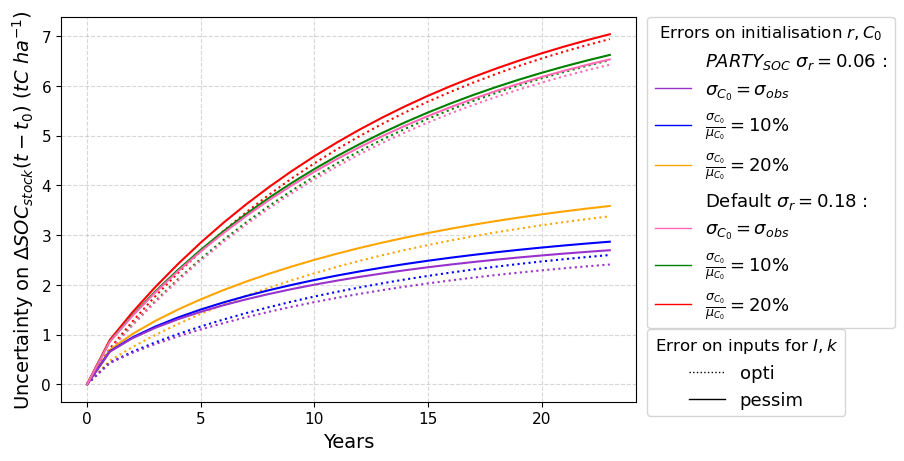

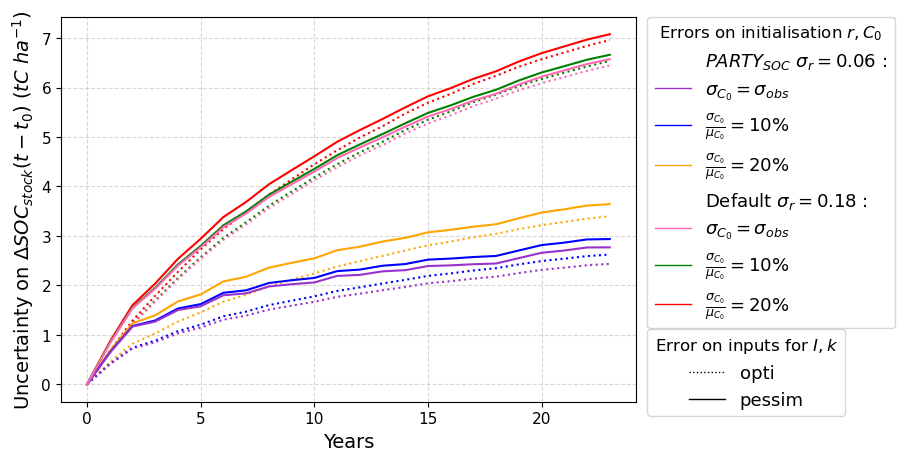

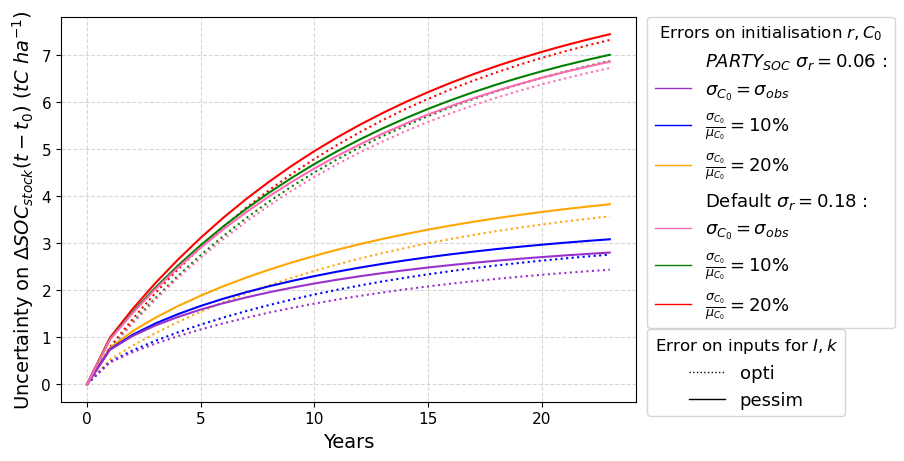

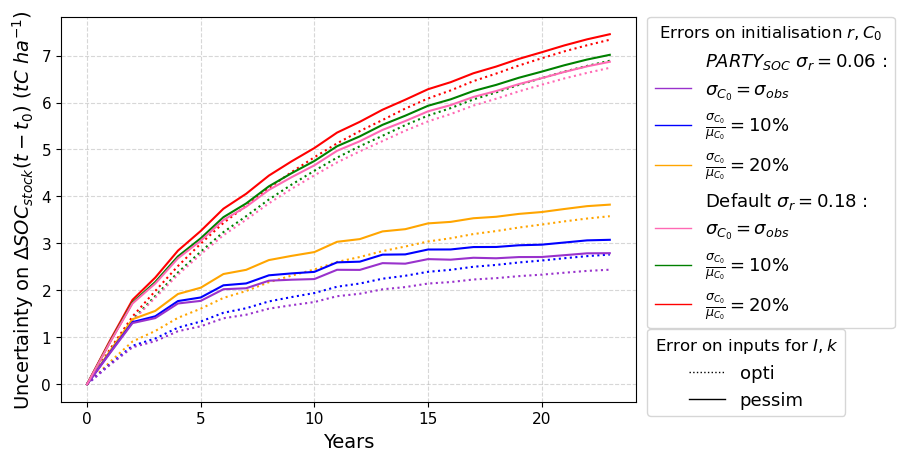

In [41]:
# Same color code and legend code as previous graph

label_map = {
    'local':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.06$',
    'large':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.18$',
    'localdef': r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.18$',
    'largeRE':  r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.06$',
    'mesdef': r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.18$',
    'mesRE':  r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.06$',
    'opti' :'opti',
    'pessim':'pessim'
}  

color_map_dict = {'local' : 'blue', 'large': 'red', 'largeRE':'orange', 'localdef':'green', 'mesRE':'darkorchid', 'mesdef':'hotpink'}
style_map_dict = {'opti':'dotted', 'pessim':'solid'}


dir_path_figures = '../figures/uncertainty_evolution/temporal_delta_SOC/opti_pessim/'

ylabel = 'Uncertainty on $\Delta SOC_{stock}(t-t_0)$ ($tC~ha^{-1}$)'


plot_sigma(
    sigma_Delta_LEG_opti_pessim,
    key='stationary',
    dir_path=dir_path_figures,
    title='LEG - Evolution of SOC stock uncertainty for Stationary case',
    filename='LEG_evolution_Delta_stationary_uncertainty_all_scenario.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

plot_sigma(
    sigma_Delta_LEG_opti_pessim,
    key='vari',
    dir_path=dir_path_figures,
    title='LEG - Evolution of SOC stock uncertainty for vari case',
    filename='LEG_evolution_Delta_vari_uncertainty_all_scenario.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

plot_sigma(
    sigma_Delta_PRO_opti_pessim,
    key='stationary',
    dir_path=dir_path_figures,
    title='PRO - Evolution of SOC stock uncertainty for Stationary case',
    filename='PRO_evolution_Delta_stationary_uncertainty_all_scenario.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

plot_sigma(
    sigma_Delta_PRO_opti_pessim,
    key='vari',
    dir_path=dir_path_figures,
    title='PRO - Evolution of SOC stock uncertainty for vari case',
    filename='PRO_evolution_Delta_vari_uncertainty.png',
    ylabel=ylabel,
    xlabel=xlabel,
    label_map=label_map,
    color_map_dict=color_map_dict,
    style_map_dict=style_map_dict
)

## Supplemental figures : Differences of uncertainty engendered by different error scenario for AMG inputs to compute uncertainties of carbon inputs ($\sigma_{I}$) and mineralisation rate ($\sigma_{k}$) (Fig. S16 and S17)

/tmp/ipykernel_89321/3446676304.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(9, 4.5))


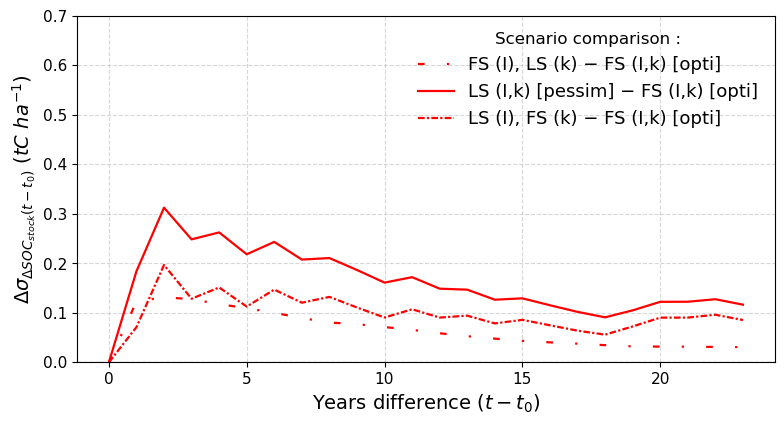

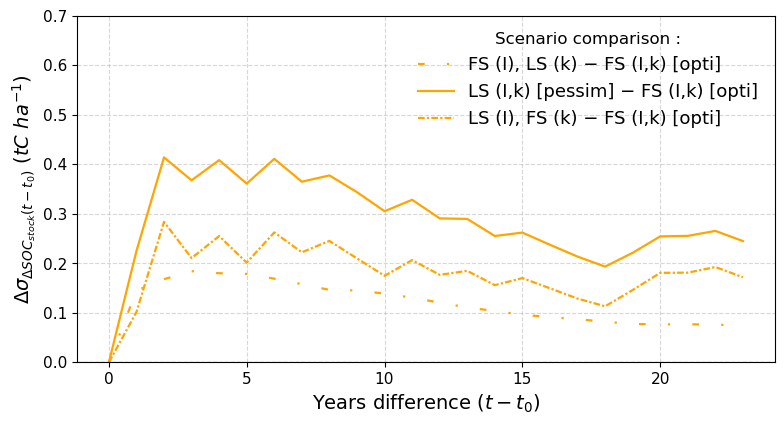

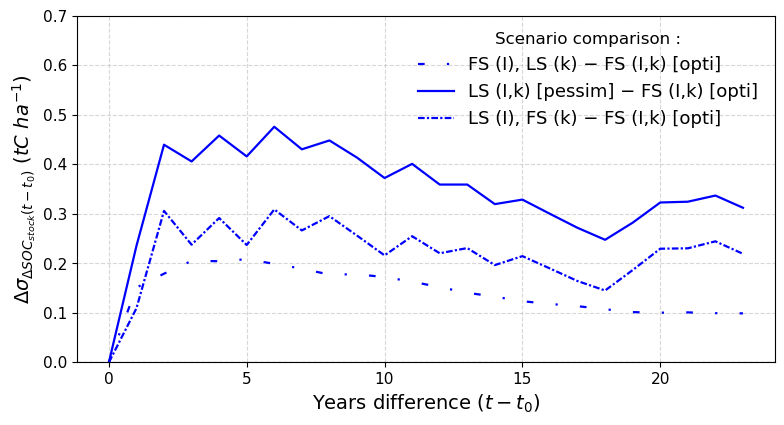

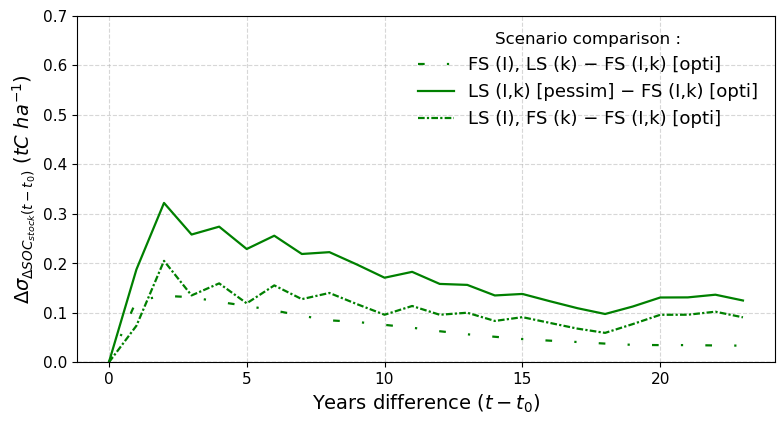

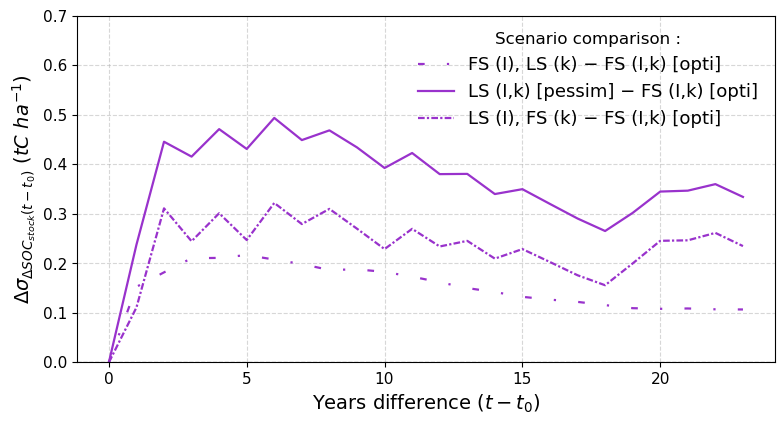

...

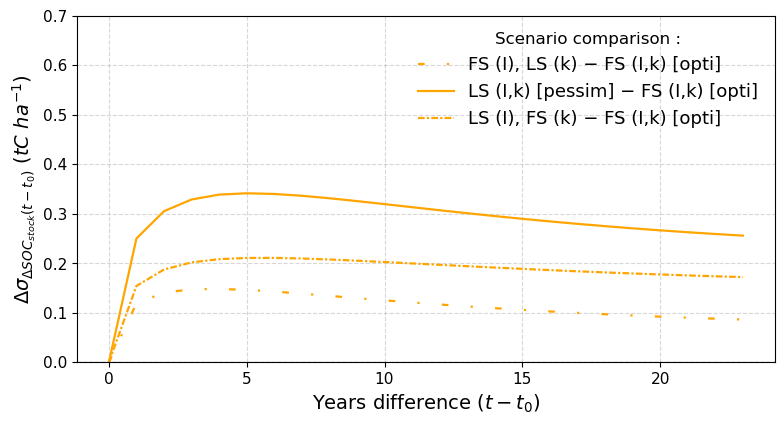

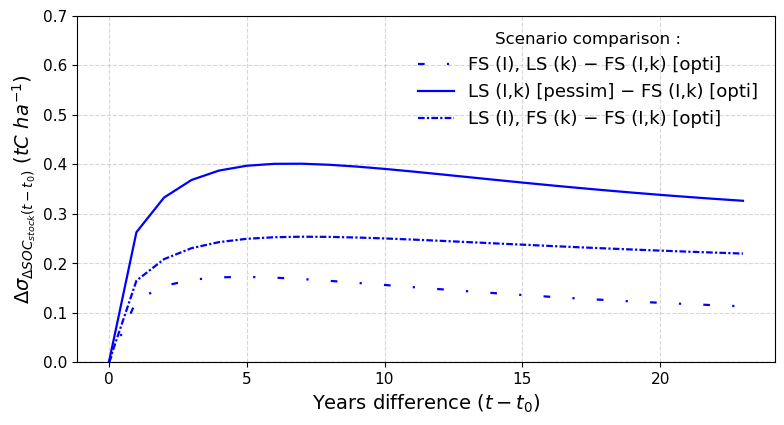

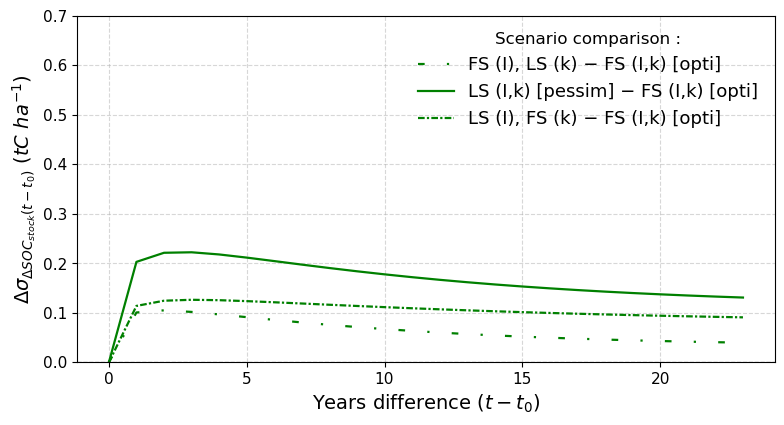

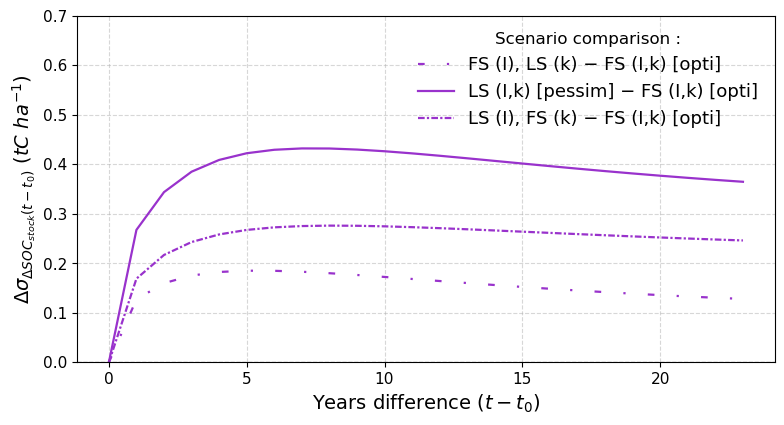

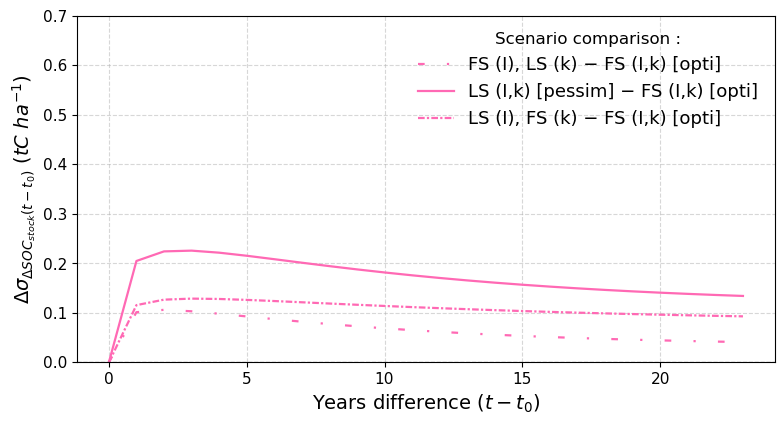

In [28]:
# Same color code and legend code as previous graph

label_map = {
    'local':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.06$',
    'large':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.18$',
    'localdef': r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.18$',
    'largeRE':  r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.06$',
    'mesdef': r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.18$',
    'mesRE':  r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.06$',
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    
}  

color_map_dict = {'local' : 'blue', 'large': 'red', 'largeRE':'orange', 'localdef':'green', 'mesRE':'darkorchid', 'mesdef':'hotpink'}
style_map_dict = {'opti':'dotted', 'pessim':'solid', 'ACEOkLS':(0,(3,10,1,10)), 'regstatk10': (0,(3,1,1,1))}


dir_path_figures = '../figures/uncertainty_evolution/temporal_delta_SOC/diff_uncertainty_vs_opti_individual_plot_per_init/'

xlabel=r'Years difference ($t-t_0$)'


plot_sigma_diff_by_C0r_reference(
    sigma_Delta_LEG,
    reference='opti',
    key='vari',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{\Delta SOC_{stock}(t-t_0)} ~(tC~ha^{-1})$',
    xlabel=xlabel,
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)



plot_sigma_diff_by_C0r_reference(
    sigma_Delta_PRO,
    reference='opti',
    key='vari',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{\Delta SOC_{stock}(t-t_0)} ~(tC~ha^{-1})$',
    xlabel=xlabel,
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)

plot_sigma_diff_by_C0r_reference(
    sigma_Delta_LEG,
    reference='opti',
    key='stationary',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{\Delta SOC_{stock}(t-t_0)} ~(tC~ha^{-1})$',
    xlabel=xlabel,
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)



plot_sigma_diff_by_C0r_reference(
    sigma_Delta_PRO,
    reference='opti',
    key='stationary',
    dir_path=dir_path_figures,
    ylabel=r'$\Delta \sigma_{\Delta SOC_{stock}(t-t_0)} ~(tC~ha^{-1})$',
    xlabel=xlabel,
    label_map=label_map,
    style_label_map={
    'opti':       'FS (I,k) [opti]',
    'pessim':     'LS (I,k) [pessim]',
    'ACEOkLS':    'FS (I), LS (k)',
    'regstatk10': 'LS (I), FS (k)'
    },
    style_map_dict=style_map_dict,
    color_map_dict=color_map_dict
)

